# INM430 - DS Project Report/Analysis Section

***
Student Name: Thi Pham (ID: 180047600)

Project Title: Customers Segmentation: study of a small UK online retailer.

Term: First Term, 2018

Course: MSc Data Science (City, University College of London)
***

## Structure:

### 1. Data Preparation
### 2. Exploratory Analysis
### 3. Customer Segmentation

In [3]:
# Import libraries for analysis:
%matplotlib inline

# usual imports
import csv as csv 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import scipy
import seaborn as sns

# color maps
import matplotlib.cm as cm

# intractive and more advanced plotting
import plotly as py
from IPython.core.interactiveshell import InteractiveShell
from IPython.display import Image
from mpl_toolkits.mplot3d import Axes3D

# Statistical model estimations:
import statsmodels.api as sm

# numpy for polynomial fitting and masked arrays and nas:
import numpy.polynomial.polynomial as poly
import numpy.ma as ma
from numpy import nan as Nan

# math operations:
import math

# Scipy for statistical tests and numertical operations
import scipy.cluster.hierarchy as shc
from scipy import spatial, stats
from scipy.stats import norm, kstest, poisson, ks_2samp

# datatime objects
from datetime import datetime, timedelta

# sklearns for machine learning models:
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, DBSCAN
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.metrics import silhouette_samples, silhouette_score, euclidean_distances
from sklearn.manifold import TSNE, MDS
from sklearn.neighbors import DistanceMetric
import pyamg # Special for SpectralClustering


## 1. Data Preparation
We need to download the data from: __[here](https://archive.ics.uci.edu/ml/datasets/online+retail)__

In [4]:
df_initial = pd.read_csv('/Users/mac/Desktop/DSCity Project 2018/Data Online Retail/online_Retail.csv',encoding="UTF-8",
                         dtype={'CustomerID': str,'InvoiceID': str})
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
InvoiceNo      541909 non-null object
StockCode      541909 non-null object
Description    540455 non-null object
Quantity       541909 non-null int64
InvoiceDate    541909 non-null object
UnitPrice      541909 non-null float64
CustomerID     406829 non-null object
Country        541909 non-null object
dtypes: float64(1), int64(1), object(6)
memory usage: 33.1+ MB


In [5]:
df_initial.describe()

,Quantity,UnitPrice
count,541909.000000,541909.000000
mean,9.552250,4.611114
std,218.081158,96.759853
min,-80995.000000,-11062.060000
25%,1.000000,1.250000
50%,3.000000,2.080000
75%,10.000000,4.130000
max,80995.000000,38970.000000


In [6]:
# The dataframe looks like this:
df_initial.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01/12/2010 08:26,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01/12/2010 08:26,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01/12/2010 08:26,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01/12/2010 08:26,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01/12/2010 08:26,3.39,17850,United Kingdom


Each transacion is a row. Each invoiceNo represents an order, which can have many transacions. Each StockCode represents a stock product or product type. Each CustomerID is a customer.

In [7]:
# Unique values for each column
df_initial.iloc[:,:7].nunique()

InvoiceNo      25900
StockCode       4070
Description     4223
Quantity         722
InvoiceDate    23260
UnitPrice       1630
CustomerID      4372
dtype: int64

In [8]:
# We want to use the InvoiceDate column later so we will convert the data into a timestamp:
# Convert the current time string to datetime in UK format (as Python only reads US time)
df_initial['us_datetime'] = [datetime.strptime(d, '%d/%m/%Y %H:%M') for d in df_initial.InvoiceDate]

### 1.1 Data investigation:

__Duplicates:__

In [9]:
# Mark duplicates into a column. We will subset the dataframe to get a clean dataframe after marking
# down all these trouble entries:
print('Duplicates: {}'.format(df_initial.duplicated().sum()))
df_initial['duplicate'] = df_initial.duplicated()

Duplicates: 5268


__Missing values__:

The CustomerID and Description columns miss 25% and 0.3% of total entries respectively. These are large number of missing values. However, as we intended to carry out analysis based on customers later on we decided to remove these observations.

In [10]:
# Check for number of missing values in each column:
print('Missing values by column: \n-------------------------------------------')
df_initial.shape[0]-df_initial.count()

Missing values by column: 
-------------------------------------------


InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
us_datetime         0
duplicate           0
dtype: int64

In [11]:
# Create columns marking missing values in Description and CustomerID:
# We keep them for the Exploratory analysis and discard them for the Customer Segmentation and
# Frequency prediction subsections:
df_initial['naCustomerID'] = df_initial['CustomerID'].isnull()
df_initial['naDescrip'] = df_initial['Description'].isnull()

__Problematic entries__: 

_Negative Quantities and False Positive Quantities_:

2% of the quantity column’s entries are negative.1/5 of these negative values have corresponding positive entries which have the same customers, absolute value but opposite sign. We decided to exclude these observations.

An example of such entries done by the same customer is shown below, which was extracted from Excel. (The negative entry marked in <font color=red>red</font> and the corresponding positive entry marked in <font color=green>green</font>)

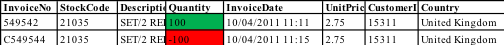

In [12]:
Image(filename='/Users/mac/Desktop/DSCity Project 2018/Data Online Retail/Table1.png')

In [13]:
# Mark these entries to subset them out of the data later: (It might take a long time for this
# code to run)
neg_quantity = []
risk_pos_quantity = []
for index in df_initial.index:
    x = df_initial.loc[index,'Quantity']
    y = df_initial.loc[index,'CustomerID']
    z = df_initial.loc[index,'Description']
    s = df_initial.loc[index,'StockCode']
    if x < 0:
        #print(index)
        neg_quantity.append(index)
        subset = df_initial[(df_initial['Quantity'] == -x) & 
                          (df_initial['CustomerID'] == y ) &
                          (df_initial['Description'] == z) &
                          (df_initial['StockCode'] == s )]
        #print(subset.shape)
        if subset.shape[0] >= 1:
            risk_pos_quantity.append(subset.index.values[0])

In [14]:
print("Number of negative quantities: ",len(neg_quantity))
print("Number of false positive orders: ",len(risk_pos_quantity))

Number of negative quantities:  10624
Number of false positive orders:  3244


_Positive quantities with special codes:_

Among the entries with positive quantities, there is a group of entries whose corresponding content in the StockCode and Description columns appeared to be non-product related such as: ‘POST' for postage, 'BANK CHARGES', C2 for ‘carriage’, 'S' for 'Sample', 'DOT' for other dotcom postage and 'gift_001_...' for gift vouchers- all of which indicate non-orders. They account for 2,123 observations in total and were also removed.

In [15]:
# Print the 'special' Stock codes:
StockCode_specials = df_initial [df_initial['StockCode'].str.contains('^[a-zA-Z]+', regex=True)]['StockCode'].unique()
print(StockCode_specials)

['POST' 'D' 'C2' 'DOT' 'M' 'BANK CHARGES' 'S' 'AMAZONFEE' 'DCGS0076'
 'DCGS0003' 'gift_0001_40' 'DCGS0070' 'm' 'gift_0001_50' 'gift_0001_30'
 'gift_0001_20' 'DCGS0055' 'DCGS0072' 'DCGS0074' 'DCGS0069' 'DCGS0057'
 'DCGSSBOY' 'DCGSSGIRL' 'gift_0001_10' 'PADS' 'DCGS0004' 'DCGS0073'
 'DCGS0071' 'DCGS0068' 'DCGS0067' 'DCGS0066P' 'B' 'CRUK']


In [16]:
# Create a list of stock codes to exclude:
excl_stockcode = ['POST','BANK CHARGES','DOT','C2','gift_0001_40','gift_0001_50', \
 'gift_0001_30','gift_0001_20','gift_0001_10','S']
print('Number of observations with special stockcodes: {}'.format(\
    len(df_initial[df_initial['StockCode'].isin(list(excl_stockcode))])))

Number of observations with special stockcodes: 2244


_Negative or zero prices and zero quantity values:_

In [17]:
zero_quantity = []
zero_price = []
for index in df_initial.index:
    x = df_initial.loc[index,'Quantity']
    y = df_initial.loc[index,'UnitPrice']
    if x == 0:
        zero_quantity.append(index)
    if y <= 0:
        zero_price.append(index)
print("Number of orders with zero value for quantity: ",len(zero_quantity))
print("Number of orders with zero or less value for unit price: ",len(zero_price))

Number of orders with zero value for quantity:  0
Number of orders with zero or less value for unit price:  2517


Next, we will create columns that mark these values down so that we can create a new 'clean' dataframe after excluding observations with these values.

In [18]:
df_initial['neg_quan'] = 0
df_initial.loc[neg_quantity,'neg_quan'] = 1
df_initial['risk_pos_quan'] = 0
df_initial.loc[risk_pos_quantity,'risk_pos_quan'] = 1
df_initial['zero_quan'] = 0
df_initial.loc[zero_quantity,'zero_quan'] = 1
df_initial['zeroorless_price'] = 0
df_initial.loc[zero_price,'zeroorless_price'] = 1

### 1.2 A Cleaner Dataframe:

In [19]:
# Select out the problematic observations:
df_clean_01 = df_initial[(df_initial['duplicate']==False) & \
                           (df_initial['naCustomerID']==False) & \
                           (df_initial['naDescrip']==False) & \
                           (df_initial['neg_quan']==0) & \
                           (df_initial['risk_pos_quan']==0) & \
                           (df_initial['zero_quan']==0) & \
                           (df_initial['zeroorless_price']==0)]

# Select out the observations with 'special codes'
df_clean_02 = df_clean_01[~df_clean_01['StockCode'].isin(excl_stockcode)]

In [20]:
# Check the dataframe now:
df_clean_02.describe()

,Quantity,UnitPrice,neg_quan,risk_pos_quan,zero_quan,zeroorless_price
count,388404.000000,388404.000000,388404.0,388404.0,388404.0,388404.0
mean,12.675361,2.947287,0.0,0.0,0.0,0.0
std,42.340995,15.409031,0.0,0.0,0.0,0.0
min,1.000000,0.001000,0.0,0.0,0.0,0.0
25%,2.000000,1.250000,0.0,0.0,0.0,0.0
50%,6.000000,1.950000,0.0,0.0,0.0,0.0
75%,12.000000,3.750000,0.0,0.0,0.0,0.0
max,4800.000000,4161.060000,0.0,0.0,0.0,0.0


In [21]:
# Check for missing values:
df_clean_02.shape[0] - df_clean_02.count()

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID          0
Country             0
us_datetime         0
duplicate           0
naCustomerID        0
naDescrip           0
neg_quan            0
risk_pos_quan       0
zero_quan           0
zeroorless_price    0
dtype: int64

In [22]:
df_analysis = df_clean_02.copy()
# Drop the unused columns:
df_analysis.drop(['InvoiceDate','duplicate','naCustomerID','naDescrip','neg_quan',\
                  'risk_pos_quan','zero_quan', 'zeroorless_price'], axis=1, inplace=True)
df_analysis.head(1)

,InvoiceNo,StockCode,Description,Quantity,UnitPrice,CustomerID,Country,us_datetime
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2.55,17850,United Kingdom,2010-12-01 08:26:00


### 1.3 Data Transformation:

In [23]:
# Sales:
df_analysis['Sales'] = df_analysis['UnitPrice'] * df_analysis['Quantity']
# Unit Price bins:
# Create equal range price bins:
custom_bucket_array1 = np.linspace(0.0, 146.0, 30)
df_analysis['price_bin'] = pd.cut(df_analysis['UnitPrice'], custom_bucket_array1)
# Create 10 equal size price bins:
df_analysis['price_equal_bin'] = pd.qcut(df_analysis['UnitPrice'],10)

## 2. Exploratory Analysis:

### 2.1 Sales by country analysis:

In [24]:
# Group by countries:
df_by_country = df_analysis.groupby('Country', as_index=False).agg(
                                {'InvoiceNo':'nunique', 'Sales':'sum'}).sort_values(
                                'Sales', ascending=False)
df_by_country.columns = ['Country','no_orders','Sales']

df_by_country['% orders'] = (df_by_country['no_orders']/\
             df_by_country['no_orders'].sum()) * 100
df_by_country['% Sales'] = (df_by_country['Sales']/\
             df_by_country['Sales'].sum()) * 100
             
df_by_country['sales_per_order'] = df_by_country['Sales']/\
             df_by_country['no_orders']
             
print('number of countries: {}'.format(len(df_by_country)))

number of countries: 37


In [25]:
# Arrange the data to plot sales distribution by country:
country_pie_table = pd.DataFrame({'sum': df_by_country.sum()}).T
country_pie_table.loc['sum','Country'] = 'all_countries'
top_7_country_by_orders = df_by_country.nlargest(7,'no_orders')
country_pie_order = pd.DataFrame({'others': df_by_country.sum(axis=0)[1:] - \
                                  top_7_country_by_orders.sum()[1:]}).T
country_pie_order['Country'] = 'others'
combine_order = pd.concat([top_7_country_by_orders,country_pie_order],sort=False)
combine_order.reset_index(level=0,inplace=True)


top_7_country_by_sales = df_by_country.nlargest(7,'Sales')
country_pie_sales = pd.DataFrame({'others': df_by_country.sum(axis=0)[1:] - \
                                  top_7_country_by_sales.sum()[1:]}).T
country_pie_sales['Country'] = 'others'
combine_sales = pd.concat([top_7_country_by_sales,country_pie_sales],sort=False)
combine_sales.reset_index(level=0,inplace=True)
    
country_label_1 = combine_order.Country

country_label_2 = combine_sales.Country

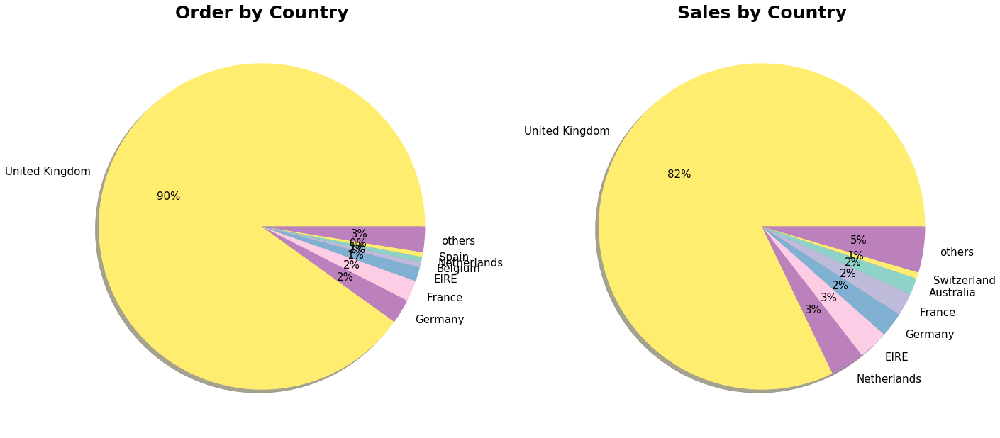

In [25]:
# Plot pie chart for sales by country:
plt.rcParams['font.size'] = 15
f, (ax1,ax2) = plt.subplots(1,2, figsize=(20,10))
cmap = plt.get_cmap('Set3_r')
colors = [cmap(i) for i in np.linspace(0, 1, 6)]        
ax1.pie(combine_order.no_orders, labels=country_label_1,autopct='%.0f%%', shadow=True, colors = colors)
ax1.set_title('Order by Country',fontsize=25, fontweight='bold')
ax2.pie(combine_sales.Sales, autopct='%.0f%%', labels=country_label_2, shadow=True, colors= colors)    
ax2.set_title('Sales by Country',fontsize=25, fontweight='bold')
#plt.suptitle('Purchase Analysis by Country', fontsize=16)
f.tight_layout()

This result indicates country of origin would not be a suitable feature for clustering as it is skewed by the UK.

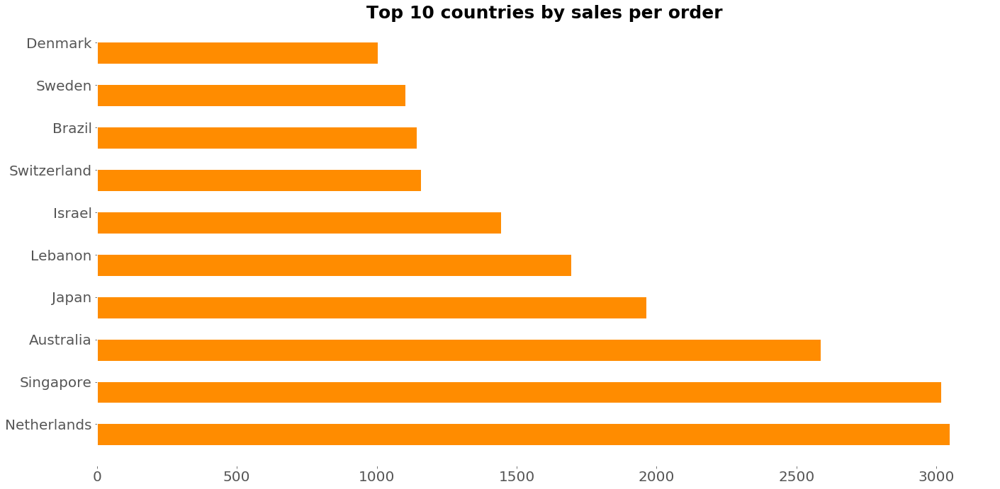

In [26]:
# Plot sales per order by country:
plt.rcParams['font.size'] = 20
val= df_by_country.nlargest(10,'sales_per_order')
x = val.Country
x_pos = np.array([i for i, _ in enumerate(x)])

width = 0.5
f, ax = plt.subplots(figsize=(20,10))
ax.set_facecolor('white')
ax.barh(x_pos, val.sales_per_order, width, color='darkorange')
#ax.set_ylabel("Country", fontsize=10)
#ax.set_xlabel("Sales per Order", fontsize=15)
ax.set_title("Top 10 countries by sales per order", fontsize=25, fontweight='bold')
ax.set_yticks(x_pos+width/2)
ax.set_yticklabels(x.values)
f.tight_layout()

### 2.2 Basket size analysis:

__Distribution of sales by order or the basket size:__


In [27]:
# Summarize the transactions by orders (each Invoice is a new order) for overall 
# and the main countries:
df_by_order = df_analysis.groupby('InvoiceNo', as_index=False).agg(
                                {'Sales':'sum','Quantity':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_by_order.columns = ['InvoiceNo', 'Sales','Quantity','no_products']

df_uk = df_analysis.loc[df_analysis['Country']=='United Kingdom',:]
df_uk_order = df_uk.groupby('InvoiceNo', as_index=False).agg(
                                {'Sales':'sum','Quantity':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_uk_order.columns = ['InvoiceNo', 'UKSales','UKQuantity','UKno_products']

df_german = df_analysis.loc[df_analysis['Country']=='Germany',:]
df_german_order = df_german.groupby('InvoiceNo', as_index=False).agg(
                                {'Sales':'sum','Quantity':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_german_order.columns = ['InvoiceNo', 'GermanSales','GermanQuantity','Germanno_products']

df_fran = df_analysis.loc[df_analysis['Country']=='France',:]
df_fran_order = df_fran.groupby('InvoiceNo', as_index=False).agg(
                                {'Sales':'sum','Quantity':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_fran_order.columns = ['InvoiceNo', 'FranSales','FranQuantity','Franno_products']

df_eire = df_analysis.loc[df_analysis['Country']=='EIRE',:]
df_eire_order = df_eire.groupby('InvoiceNo', as_index=False).agg(
                                {'Sales':'sum','Quantity':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_eire_order.columns = ['InvoiceNo', 'IrelandSales','IrelandQuantity','Irelandno_products']

df_nether = df_analysis.loc[df_analysis['Country']=='Netherlands',:]
df_nether_order = df_nether.groupby('InvoiceNo', as_index=False).agg(
                                {'Sales':'sum','Quantity':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_nether_order.columns = ['InvoiceNo', 'NetherlandSales','NetherQuantity','Netherlandno_products']

df_aus = df_analysis.loc[df_analysis['Country']=='Australia',:]
df_aus_order = df_aus.groupby('InvoiceNo', as_index=False).agg(
                                {'Sales':'sum','Quantity':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_aus_order.columns = ['InvoiceNo', 'AusSales','AusQuantity','Ausno_products']

df_by_order.describe()

,Sales,Quantity,no_products
count,18325.000000,18325.000000,18325.000000
mean,457.608104,268.658172,20.933806
std,964.398200,541.178554,23.792854
min,0.380000,1.000000,1.000000
25%,156.050000,75.000000,7.000000
50%,300.420000,154.000000,15.000000
75%,460.940000,289.000000,27.000000
max,38970.000000,15049.000000,540.000000


In [28]:
df_by_order.head(3)

,InvoiceNo,Sales,Quantity,no_products
7835,556444,38970.00,60,1
12273,567423,27872.80,11816,11
8021,556917,22775.93,15049,138


There is an interesting mix of distributions of basket sizes by countries, where basket size is defined as the sales by each order (column Sales grouped by column InvoiceNo).

We will use KDE density plots to more easily see the shape of the distribution of the data.

/Users/mac/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



Text(0.5, 1.0, 'KDE_density plot: Sales per order by country')

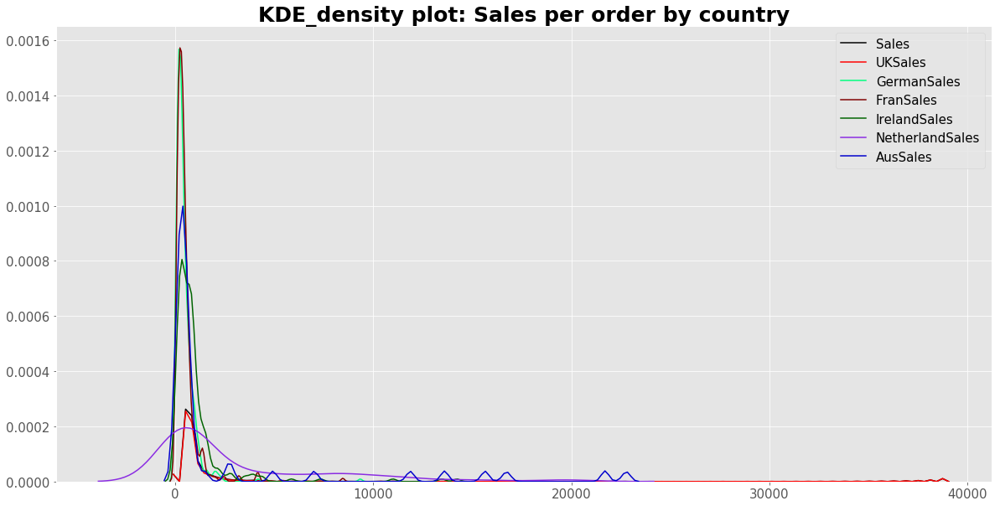

In [28]:
# Plot the distribution of these countries to compare them in terms of sales per basket
plt.rcParams['font.size'] = 15
plt.subplots(figsize=(20,10))
p1=sns.kdeplot(df_by_order['Sales'], color="black",cumulative=False)
p1=sns.kdeplot(df_uk_order['UKSales'], color="red", cumulative =False)
p1=sns.kdeplot(df_german_order['GermanSales'], color="springgreen", cumulative =False)
p1=sns.kdeplot(df_fran_order['FranSales'], color="maroon", cumulative =False)
p1=sns.kdeplot(df_eire_order['IrelandSales'], color="darkgreen", cumulative =False)
p1=sns.kdeplot(df_nether_order['NetherlandSales'], color="blueviolet", cumulative =False)
p1=sns.kdeplot(df_aus_order['AusSales'], color="mediumblue", cumulative =False)
p1.set_title('KDE_density plot: Sales per order by country', fontweight='bold', fontsize=25)


Text(0.5, 1.0, 'KDE_density plot: Log(Sales per order) by country')

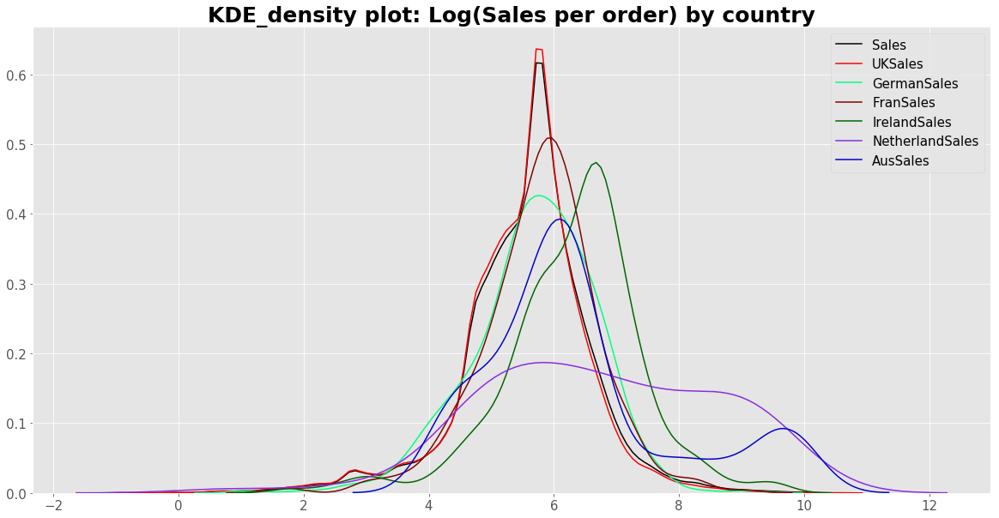

In [29]:
# Taking logs to reduce the impact of extreme values:
plt.rcParams['font.size'] = 15
plt.subplots(figsize=(20,10))
p1=sns.kdeplot(df_by_order['Sales'].apply(np.log), color="black",cumulative=False)
p1=sns.kdeplot(df_uk_order['UKSales'].apply(np.log), color="red", cumulative =False)
p1=sns.kdeplot(df_german_order['GermanSales'].apply(np.log), color="springgreen", cumulative =False)
p1=sns.kdeplot(df_fran_order['FranSales'].apply(np.log), color="maroon", cumulative =False)
p1=sns.kdeplot(df_eire_order['IrelandSales'].apply(np.log), color="darkgreen", cumulative =False)
p1=sns.kdeplot(df_nether_order['NetherlandSales'].apply(np.log), color="blueviolet", cumulative =False)
p1=sns.kdeplot(df_aus_order['AusSales'].apply(np.log), color="mediumblue", cumulative =False)
p1.set_title('KDE_density plot: Log(Sales per order) by country', fontweight='bold', fontsize=25)

### 2.2 Pricing policy analysis:

Most transactions are completed at the lower end of the price range. The log density plot on the right side below gives a clearer distribution of the unit prices.

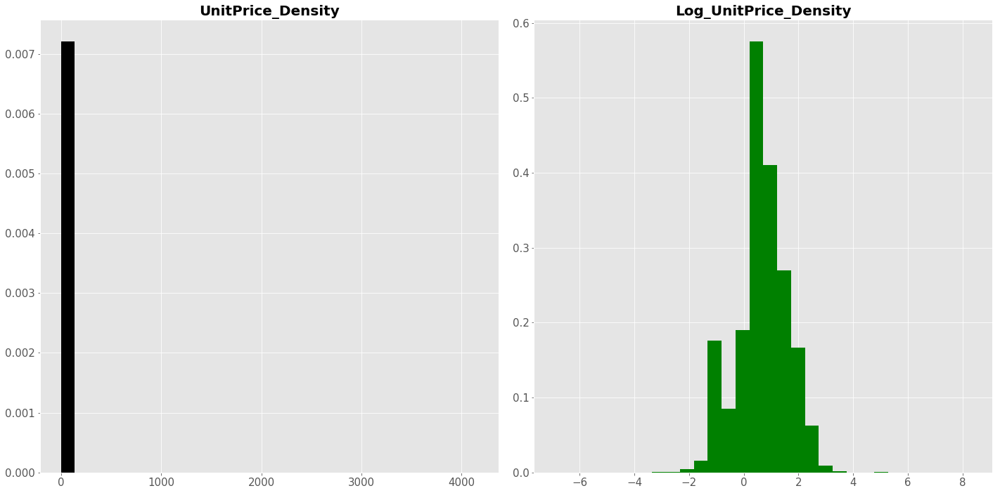

In [30]:
# Density plot with unequal size price bins (30 bins)
plt.rcParams['font.size'] = 15
f, (ax1,ax2) = plt.subplots(1,2, figsize=(20,10))
ax1.hist(df_analysis['UnitPrice'],density=True, color='black',bins=30)
ax1.set_title('UnitPrice_Density', fontweight='bold', fontsize=20)
ax2.hist(df_analysis['UnitPrice'].apply(np.log),density=True, color='green',bins=30)
ax2.set_title('Log_UnitPrice_Density', fontweight='bold', fontsize=20)
f.tight_layout()

It might be more useful to look at equally-sized unit price bins so that extreme values would not cause confusion for the visual analysis.

In [31]:
# Group transactions by price range where 
# price ranges are created by both unequal and equal bins in terms of size.

# unequal bins
df_by_unitprice1 = df_analysis.groupby('price_bin', as_index=False).agg(
                                {'Sales':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_by_unitprice1.columns = ['UnitPrice', 'Sales','no_products']


# equally sized bins (derived using pd.qcut from Data Transfomration section)
df_by_unitprice2 = df_analysis.groupby('price_equal_bin', as_index=False).agg(
                                {'Sales':'sum','StockCode':'nunique'}).sort_values(
                                'Sales', ascending=False)
df_by_unitprice2.columns = ['UnitPrice', 'Sales','no_products']

In [32]:
df_by_unitprice1.head(3)

,UnitPrice,Sales,no_products
0,"(0.0, 5.034]",6.733803e+06,3234
1,"(5.034, 10.069]",1.112402e+06,720
2,"(10.069, 15.103]",3.578938e+05,182


In [33]:
df_by_unitprice2.head(3)

,UnitPrice,Sales,no_products
9,"(6.25, 4161.06]",1362786.17,688
6,"(2.1, 2.95]",1025304.46,781
8,"(4.15, 6.25]",1012847.57,619


The graph below on the right (for equal sized price bins) shows that the most sales is generated by items priced at up to 0.5 per unit.

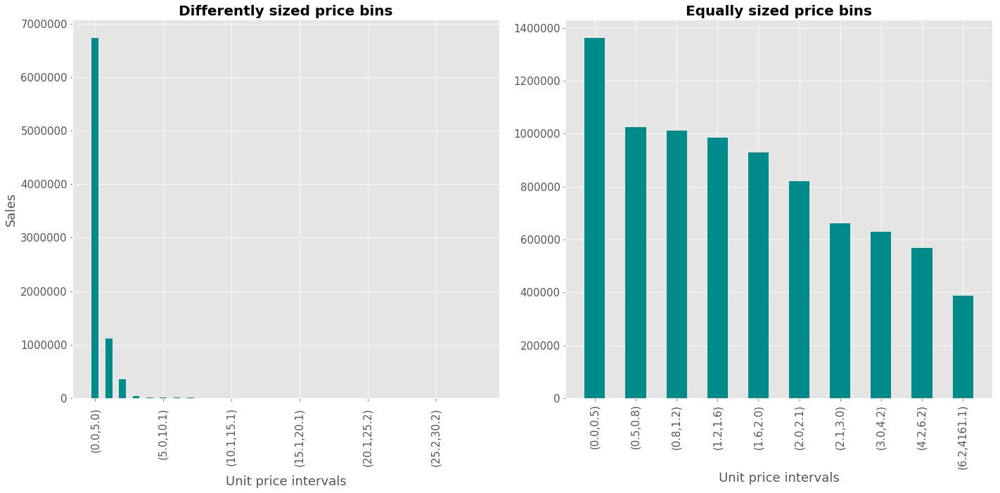

In [34]:
# Create labels for the plots:
categories1 = df_analysis['price_bin'].cat.categories
categories2 = df_analysis['price_equal_bin'].cat.categories
labels1 = []
for i in categories1:
#    label = round((i.left+i.right)/2,1)
#    labels1.append(label)
    labels1.append('({},{})'.format(round(i.left,1),round(i.right,1)))

labels2 = []
for i in categories2:
#    label = round((i.left+i.right)/2,3)
#    labels2.append(label) 
    labels2.append('({},{})'.format(round(i.left,1),round(i.right,1)))

ind1 = np.array([x for x, _ in enumerate(categories1)])
ind2 = np.array([x for x, _ in enumerate(categories2)])
width = 0.5       

# Plot Sales per unit price bin:
plt.rcParams['font.size'] = 15
f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))

ax1.bar(ind1, df_by_unitprice1.Sales, width,tick_label = labels1, label='sales_by_unitprice', color='darkcyan', alpha=1)
ax1.set_title('Differently sized price bins', fontweight='bold', fontsize=20)
ax1.set_xlabel('Unit price intervals', labelpad=13)
ax1.set_ylabel('Sales')
ax1.set_xticklabels(labels1, rotation=90)
ax1.set_xticks(np.arange(min(ind1), max(ind1)+1, 5.0))
ax1.tick_params(axis='x', which='major', pad=10)

ax2.bar(ind2, df_by_unitprice2.Sales, width,tick_label = labels2, label='sales_by_unitprice', color='darkcyan', alpha=1)
ax2.set_title('Equally sized price bins', fontweight='bold', fontsize=20)
ax2.set_xlabel('Unit price intervals')
ax2.tick_params(axis='x', which='major', pad=5)
plt.xticks(rotation = 90)

f.tight_layout()

### 2.3 Customers analysis: Price preferences and Frequency (Feature Derivation)

__Customers' price sensitivity:__

Firstly, we create a new dataframe by grouping by customers and price bins:

In [35]:
# Group by customers and price bins and calculate Sales/Order
df_by_customer_price = df_analysis.groupby(['CustomerID','price_equal_bin'],\
                    as_index=False).agg({'Sales':'sum','InvoiceNo':'nunique'})
df_by_customer_price['Sales/Order'] = df_by_customer_price['Sales']/\
                                df_by_customer_price['InvoiceNo']

df_by_customer_price.head(3)

,CustomerID,price_equal_bin,Sales,InvoiceNo,Sales/Order
0,12347,"(0.0, 0.5]",55.44,5,11.088000
1,12347,"(0.5, 0.85]",490.08,7,70.011429
2,12347,"(0.85, 1.25]",604.60,7,86.371429


Then we create another new dataframe by pivoting the above such that rows are customers and columns are price bins (equally sized price ranges created in section 1.3):

In [36]:
# Analysis based on price:
# Get the price range list:
price_equal_bin_list = df_analysis.price_equal_bin.unique().sort_values()

# Turn the above into labels by converting them to strings:
price_equal_bin_names = price_equal_bin_list.astype('str')
price_bin_dict= dict(zip(price_equal_bin_list,price_equal_bin_names))

# Pivot the data frame so that rows are customers and columns are price bins:
df_by_customer_price_pivot = df_by_customer_price.pivot(index='CustomerID', columns='price_equal_bin', values='Sales/Order')
df_by_customer_price_pivot.columns = list(price_equal_bin_names)
df_by_customer_price_pivot.reset_index(inplace=True)
df_by_customer_price_pivot.fillna(0, inplace=True)
df_by_customer_price_pivot.head(3)

,CustomerID,"(0.0, 0.5]","(0.5, 0.85]","(0.85, 1.25]","(1.25, 1.65]","(1.65, 1.95]","(1.95, 2.1]","(2.1, 2.95]","(2.95, 4.15]","(4.15, 6.25]","(6.25, 4161.06]"
0,12347,11.088,70.011429,86.371429,56.485714,61.47,32.544,108.15,124.023333,105.665,65.77
1,12348,236.520,70.066667,290.000000,174.000000,0.00,0.000,0.00,0.000000,0.000,0.00
2,12349,21.000,67.800000,130.000000,259.560000,78.52,67.080,136.44,85.700000,228.050,383.40


Analysing customers in terms of their preferences for prices, we found that for certain price ranges customers have more similar purchase patterns than for other ranges. For example, sales/order made in price ranges 1.25-1.65 and 2.95-4.15 have a stronger positive correlation (+0.5) than that between 1.25-1.65 and 0.0-0.5 (+0.2).

Text(0.5, 1.0, 'Correlation (Pearson): Sales/Order made by Customers across Price Ranges')

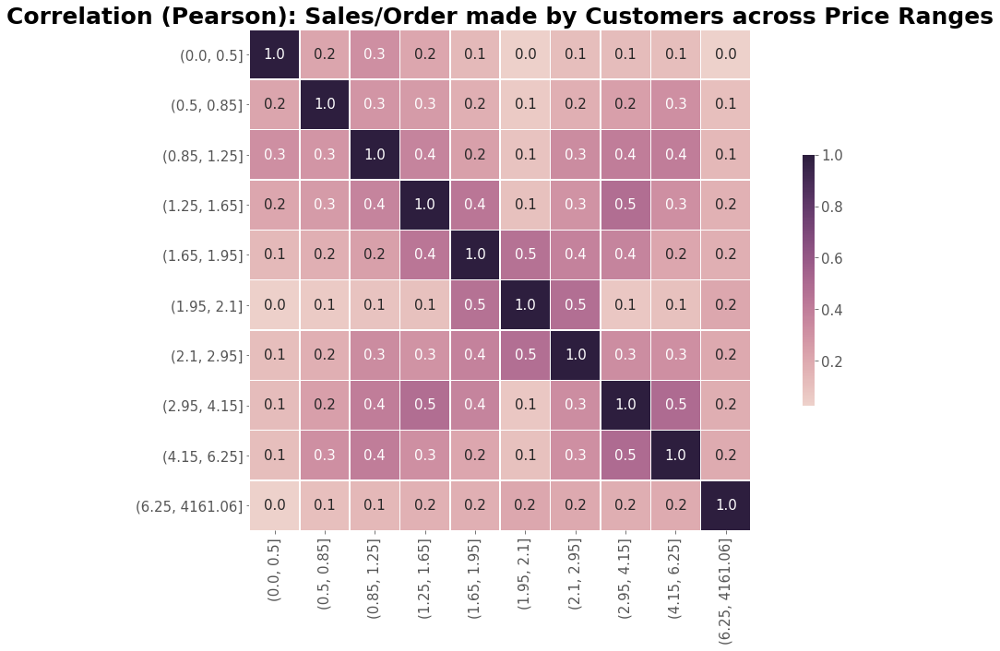

In [37]:
# Create dataframe to fit into the correlation matrix:
df_by_customer_price_corr = df_by_customer_price_pivot.iloc[:,1:] + 1

# Plot the correlation matrix to show the relationship 
# between sales generated by different price ranges
corr_pearson_pricebin_cus = df_by_customer_price_pivot.corr('pearson')
#Plot figsize
#mask = np.zeros_like(corr, dtype=np.bool)
#mask[np.triu_indices_from(mask)] = True

plt.rcParams['font.size'] = 15
fig, ax = plt.subplots(figsize=(20,10))
#Generate Color Map, red & blue
colormap = sns.cubehelix_palette(10,as_cmap=True)
#Generate Heat Map, allow annotations and place floats in map
#sns.heatmap(corr, mask=mask, cmap=colormap, \
#    annot=True, fmt=".1f",square=True, linewidths=.5, cbar_kws={"shrink": .5})
sns.heatmap(corr_pearson_pricebin_cus, cmap=colormap, \
    annot=True, fmt=".1f",square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title('Correlation (Pearson): Sales/Order made by Customers across Price Ranges',fontweight='bold', fontsize=25)


__Customers Frequency and Basket Sizes (Sales/Order):__

A reminder for the formulae (Footnote 1, page 1, PDF report)

$\text{Frequency} = \frac{\text{Number of orders}}{\text{Last purchase date}-\text{First purchase date}}$ (1)

$\text{Recency} = \text{Last date of period }-\text{ Last purchase date}$ (2)

36% of the customers only visited once during the study period, 2.1% of the customers visited for the first time on the last day of the study period.

In [38]:
# Group by customers:
df_by_customer = df_analysis.groupby('CustomerID', as_index=False).agg(\
            {'Sales':{'Sales_sum':'sum'},\
             'InvoiceNo':'nunique',\
            'us_datetime':{'first_purchase':'min',\
            'last_purchase':'max'},'StockCode':'nunique'})

# Rename the columns so that they are more readable:
df_by_customer.columns = pd.Index(['CustomerID', 'Sales_sum', 'no_orders',\
       'first_purchase', 'last_purchase',\
       'no_products'])

# Create the numericals to fit into the calculations for Frequency and Recency:
df_by_customer['Length'] = (df_by_customer.last_purchase - \
            df_by_customer.first_purchase).dt.days
                  
df_by_customer['Frequency'] = (df_by_customer['no_orders']/df_by_customer['Length'])

df_by_customer['Sales/Order'] = df_by_customer['Sales_sum']/df_by_customer['no_orders']

df_by_customer['normal_frequency'] = df_by_customer['Frequency'].apply(\
              lambda x:0  if np.isinf(x) == True or x<0.0 else x)

last_date_study = df_initial['us_datetime'].max()
df_by_customer['Recency'] = ((last_date_study + timedelta(days=1)) - df_by_customer['last_purchase']).dt.days

zero_frequency = len(df_by_customer[df_by_customer['normal_frequency']==0])/df_by_customer.shape[0]*100
last_day_customer = len(df_by_customer[df_by_customer['Recency']==1])/df_by_customer.shape[0]*100

print('Percentage of customers who visited once and never came back: %s ' % round(zero_frequency,1))                    
print('Percentage of customers who visited on the last day of the study: %s' % round(last_day_customer,1))

/Users/mac/anaconda3/lib/python3.6/site-packages/pandas/core/groupby/groupby.py:4656: FutureWarning:

using a dict with renaming is deprecated and will be removed in a future version



Percentage of customers who visited once and never came back: 36.0 
Percentage of customers who visited on the last day of the study: 2.1


In [41]:
df_by_customer.head(3)

,CustomerID,Sales_sum,no_orders,first_purchase,last_purchase,no_products,Length,Frequency,Sales/Order,normal_frequency,Recency
0,12347,4310.00,7,2010-12-07 14:57:00,2011-12-07 15:52:00,103,365,0.019178,615.714286,0.019178,2
1,12348,1437.24,4,2010-12-16 19:09:00,2011-09-25 13:13:00,21,282,0.014184,359.310000,0.014184,75
2,12349,1457.55,1,2011-11-21 09:51:00,2011-11-21 09:51:00,72,0,inf,1457.550000,0.000000,19


In [39]:
# Plot the Frequency of customers over time:
# Quick summary by grouping customers by first purchase time:
df_by_customer_firstpurchase = df_by_customer.groupby('first_purchase', as_index=False).agg(\
            {'Sales/Order':{'Sales/Order':'mean'},\
            'normal_frequency':{'av_normalfrequency':'mean'},\
            'Recency':{'av_Recency':'mean'}}).sort_values('first_purchase',ascending=True)
df_by_customer_firstpurchase.columns = ['first_purchase','av_Sales/Order','av_normal_freq',\
                                       'av_Recency']
df_by_customer_firstpurchase.head(3)


,first_purchase,av_Sales/Order,av_normal_freq,av_Recency
0,2010-12-01 08:26:00,157.186765,34.000000,372.0
1,2010-12-01 08:34:00,356.232222,0.028391,57.0
2,2010-12-01 08:45:00,442.969333,0.040541,3.0


Text(0.5, 1.0, 'Frequency of purchase by date and time of first purchase')

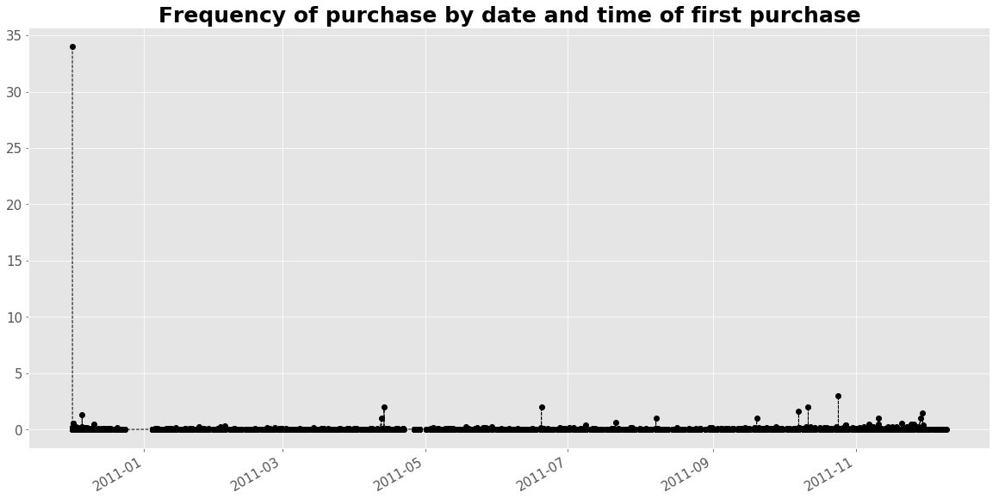

In [40]:
plt.rcParams['font.size'] = 15
fig, ax = plt.subplots(figsize=(20,10))
ax = plt.plot_date(df_by_customer_firstpurchase['first_purchase'], df_by_customer_firstpurchase['av_normal_freq'],\
              linestyle='--',c='black',linewidth=1)
fig.autofmt_xdate()
plt.title('Frequency of purchase by date and time of first purchase',fontweight='bold', fontsize=25)

Log-normalisation reduces the impact of extreme values and the trend can be seen more clearly below.

Text(0.5, 1.0, 'Log_Frequency of purchase by date and time of first purchase')

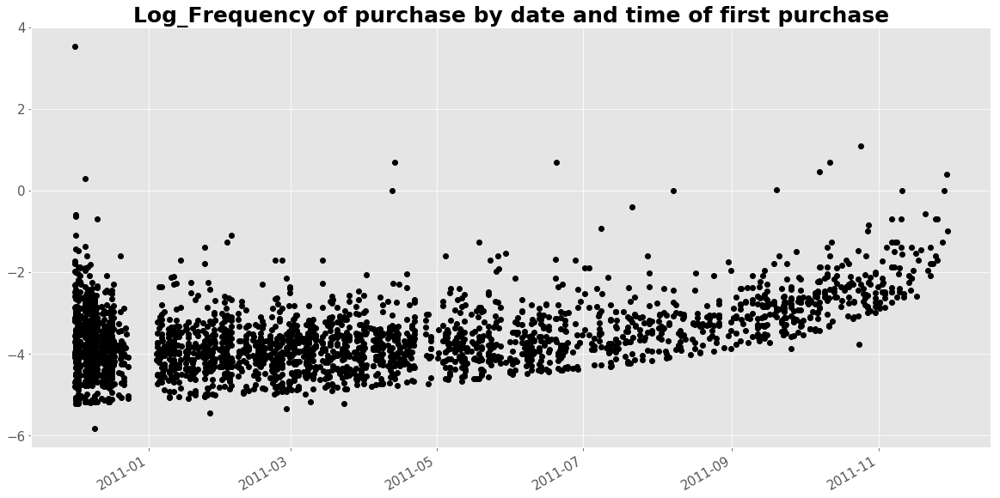

In [41]:
plt.rcParams['font.size'] = 15
fig, ax = plt.subplots(figsize=(20,10))
ax = plt.plot_date(df_by_customer_firstpurchase['first_purchase'], df_by_customer_firstpurchase['av_normal_freq'].apply(np.log),\
              c='black')
fig.autofmt_xdate()
plt.title('Log_Frequency of purchase by date and time of first purchase',fontweight='bold', fontsize=25)

The same cannot be applied for the avereage of Sales/Order. This monetary aspect of the customer seems to be stationary over time.

Text(0.5, 1.0, 'Log_av_Sales/Order of purchase by date and time of first purchase')

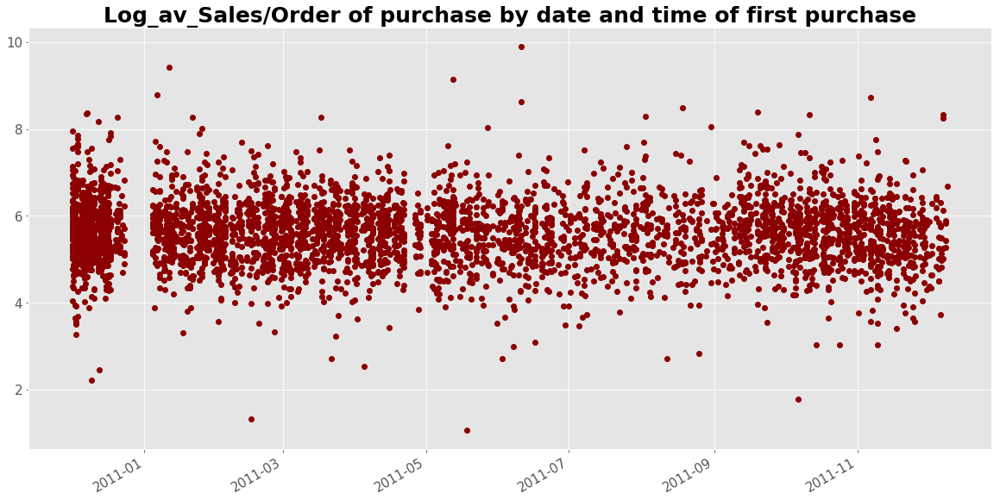

In [42]:
plt.rcParams['font.size'] = 15
fig, ax = plt.subplots(figsize=(20,10))
ax = plt.plot_date(df_by_customer_firstpurchase['first_purchase'], df_by_customer_firstpurchase['av_Sales/Order'].apply(np.log),\
              c='darkred')
fig.autofmt_xdate()
plt.title('Log_av_Sales/Order of purchase by date and time of first purchase',fontweight='bold', fontsize=25)

## 3. Customers Segmentation

First we need to bring the data together into a new dataframe for this analysis:

In [43]:
# select the columns that we want to use:
df_by_customer_sub = df_by_customer[['CustomerID','first_purchase','last_purchase', 'Recency',\
                                   'Sales/Order','normal_frequency']]

# Merge with the price bins data frame from earlier:
df_by_customer_seg = pd.merge(df_by_customer_sub,df_by_customer_price_pivot,
                        on='CustomerID')
df_by_customer_seg.head(3)

,CustomerID,first_purchase,last_purchase,Recency,Sales/Order,normal_frequency,"(0.0, 0.5]","(0.5, 0.85]","(0.85, 1.25]","(1.25, 1.65]","(1.65, 1.95]","(1.95, 2.1]","(2.1, 2.95]","(2.95, 4.15]","(4.15, 6.25]","(6.25, 4161.06]"
0,12347,2010-12-07 14:57:00,2011-12-07 15:52:00,2,615.714286,0.019178,11.088,70.011429,86.371429,56.485714,61.47,32.544,108.15,124.023333,105.665,65.77
1,12348,2010-12-16 19:09:00,2011-09-25 13:13:00,75,359.310000,0.014184,236.520,70.066667,290.000000,174.000000,0.00,0.000,0.00,0.000000,0.000,0.00
2,12349,2011-11-21 09:51:00,2011-11-21 09:51:00,19,1457.550000,0.000000,21.000,67.800000,130.000000,259.560000,78.52,67.080,136.44,85.700000,228.050,383.40


In [44]:
# We are going to make the column names neater:
df_by_customer_seg.columns = ['CustomerID','first_purchase','last_purchase', 'Recency', 'Sales/Order',\
 'normal_frequency', 'pb1','pb2','pb3','pb4'
                , 'pb5', 'pb6',\
                 'pb7', 'pb8', 'pb9', 'pb10']
df_by_customer_seg.head(3)

,CustomerID,first_purchase,last_purchase,Recency,Sales/Order,normal_frequency,pb1,pb2,pb3,pb4,pb5,pb6,pb7,pb8,pb9,pb10
0,12347,2010-12-07 14:57:00,2011-12-07 15:52:00,2,615.714286,0.019178,11.088,70.011429,86.371429,56.485714,61.47,32.544,108.15,124.023333,105.665,65.77
1,12348,2010-12-16 19:09:00,2011-09-25 13:13:00,75,359.310000,0.014184,236.520,70.066667,290.000000,174.000000,0.00,0.000,0.00,0.000000,0.000,0.00
2,12349,2011-11-21 09:51:00,2011-11-21 09:51:00,19,1457.550000,0.000000,21.000,67.800000,130.000000,259.560000,78.52,67.080,136.44,85.700000,228.050,383.40


In [45]:
df_by_customer_seg.describe()

,Recency,Sales/Order,normal_frequency,pb1,pb2,pb3,pb4,pb5,pb6,pb7,pb8,pb9,pb10
count,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000,4324.000000
mean,92.692183,377.085926,0.036890,25.342392,39.629269,48.528868,53.503820,37.996646,37.503359,60.496970,49.510095,56.268021,80.280006
std,100.176201,543.334031,0.526086,61.555254,92.756026,75.225703,115.188039,124.919159,149.724126,138.257991,130.054490,111.579473,338.888683
min,1.000000,2.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,18.000000,175.337083,0.000000,0.000000,9.065833,13.712500,12.250000,0.000000,0.000000,17.700000,3.750000,14.850000,14.950000
50%,51.000000,286.994167,0.014875,12.177727,23.600000,30.516667,33.450000,15.600000,19.950000,37.430000,26.250000,35.700000,41.653125
75%,143.000000,422.953071,0.029851,30.952500,47.132500,60.000000,62.700000,37.862500,45.945000,70.440000,51.779167,68.621875,85.471875
max,374.000000,19809.750000,34.000000,2538.000000,3202.920000,1484.000000,3696.000000,3380.000000,9269.400000,3973.500000,3323.250000,3081.562143,19809.750000


### 3.1 Putting data into context

Customers whose first orders were recorded closer to the last date of the study might not have meaningful frequency data. Only customers whose first purchase was made at least a number of days before the last date should be included:

$\text{strict_averag_turnover} = \frac{{1}}{\text{Frequency}}$ (3)

where:

$\text{Frequency} = \frac{\text{Number of orders}}{\text{Last purchase date}-\text{First purchase date}}$ (1)

However, when we applied this cut, more than 30% of the data would be removed. Therefore, we decided to use a softer cut where:

$\text{soft_averag_turnover} = \frac{\text{strict_averag_turnover}}{{5}}$ (4)

In [265]:
# Remove customers whose Frequency data is not meaningful:
strict_averag_turnover = 1/df_by_customer_seg['normal_frequency'].mean()
strict_cutoff_date = df_initial['us_datetime'].max() - timedelta(strict_averag_turnover)
print('Average number of days for customers to return: {}'.format(round(strict_averag_turnover),0))

df_by_customer_seg_strict_cut = df_by_customer_seg[\
                            df_by_customer_seg['last_purchase']<strict_cutoff_date]

df_by_customer_seg_strict_cut.describe()

Average number of days for customers to return: 27


,Recency,Sales/Order,normal_frequency,pb1,pb2,pb3,pb4,pb5,pb6,pb7,pb8,pb9,pb10
count,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000,2801.000000
mean,136.420921,372.691895,0.035538,23.158302,37.660792,45.580687,48.288035,31.740354,33.063515,55.737645,40.534466,50.719311,80.019817
std,100.144201,599.408952,0.651529,68.584822,100.946982,71.602221,83.894976,109.821767,181.256268,129.475960,88.136414,85.270012,405.134402
min,28.000000,2.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,53.000000,162.800000,0.000000,0.000000,4.980000,7.500000,5.031667,0.000000,0.000000,14.750000,0.000000,9.200000,8.250000
50%,96.000000,279.170000,0.007968,8.520000,20.400000,30.000000,27.550000,10.920000,12.600000,35.400000,20.305000,32.300000,38.700000
75%,211.000000,417.890000,0.022436,27.360000,44.850000,60.000000,59.500000,33.020000,37.800000,67.200000,45.000000,64.750000,84.250000
max,374.000000,19809.750000,34.000000,2538.000000,3202.920000,1484.000000,2122.725000,3380.000000,9269.400000,3973.500000,1732.320000,2605.160000,19809.750000


In [48]:
soft_averag_turnover = strict_averag_turnover/5
soft_cutoff_date = df_initial['us_datetime'].max() - timedelta(soft_averag_turnover)
df_by_customer_seg_soft_cut = df_by_customer_seg[\
                            df_by_customer_seg['last_purchase']<soft_cutoff_date]
print('Customers need to make the first purchase at these number of days before the last date of the study to be included in the analysis: {}'.format(\
            round(soft_averag_turnover,0)))
df_by_customer_seg_soft_cut.describe()

Customers need to make the first purchase at these number of days before the last date of the study to be included in the analysis: 5.0


,Recency,Sales/Order,normal_frequency,pb1,pb2,pb3,pb4,pb5,pb6,pb7,pb8,pb9,pb10
count,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000,3862.000000
mean,103.413257,373.843091,0.035294,24.334588,38.448245,47.755487,51.977155,35.688671,36.031350,57.823762,45.626916,54.683003,79.275391
std,100.795634,552.209245,0.556290,62.571798,91.388431,74.924704,108.450820,120.891527,157.179899,122.364698,113.625799,104.923485,353.016720
min,7.000000,2.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25.000000,171.462500,0.000000,0.000000,7.800000,11.929554,9.900000,0.000000,0.000000,17.137500,0.000000,12.750000,12.750000
50%,61.000000,283.385000,0.013029,10.500000,22.380000,30.000000,32.628333,13.520000,16.800000,35.798333,24.375000,34.650000,40.312500
75%,163.000000,419.577000,0.026720,29.717500,46.235000,60.000000,62.700000,35.100000,42.693000,69.261875,49.565000,67.175000,84.400000
max,374.000000,19809.750000,34.000000,2538.000000,3202.920000,1484.000000,3696.000000,3380.000000,9269.400000,3973.500000,3119.040000,3081.562143,19809.750000


### 3.2 Investigation of data distribution & further data transformation:

We plan to use PCA and Clustering algorithms for features selection and data projections. These algorithms tend to be affected by outliers and might work better if the data is more normally distributed.

We want to investigate the distribution of the data using box plots where the whiskers are determined at (Q1 - 1.5IQR) and (Q3 + 1.5IQR):

In [49]:
df_by_customer_seg_feat = df_by_customer_seg_soft_cut.iloc[:,5:]

Text(0.5, 1.0, 'Box plts: Frequency and Sales/Order across Price Bins')

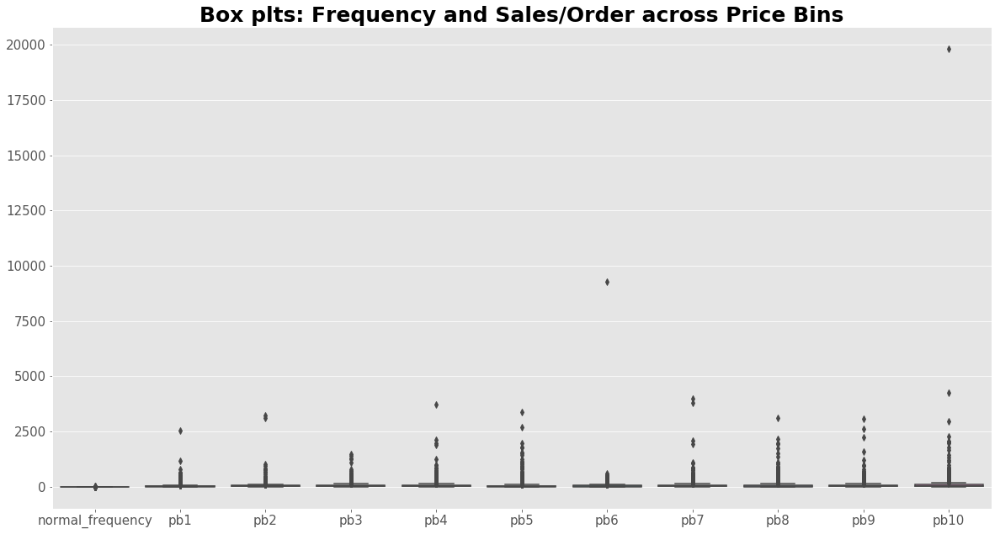

In [266]:
# Observe the distribution of data in more details:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.boxplot(data=df_by_customer_seg_feat)
plt.subplots_adjust(top=.92)
ax.set_title('Box plts: Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=25)


__Testing the effect of different data transformations:__

All variables suffer from extreme outliers. We want to try scaling them using robust based method called quantile scaling to see if the outliers' effect can be reduced.

Text(0.5, 1.0, 'Box plts: (Robust Scaler) Frequency and Sales/Order across Price Bins')

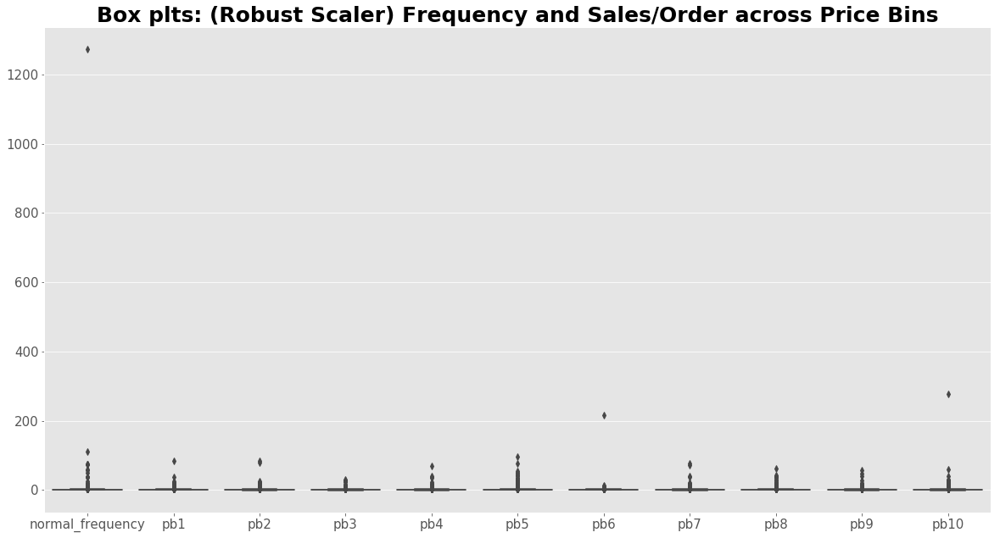

In [51]:
# Visualize:
# Robust Scaling the data to be able to see Frequency more clearly:
df_robust = (df_by_customer_seg_feat - df_by_customer_seg_feat.quantile(0.25))/\
                    (df_by_customer_seg_feat.quantile(0.75) - df_by_customer_seg_feat.quantile(0.25))
# Visualize:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.boxplot(data=(df_robust))
plt.subplots_adjust(top=.92)
ax.set_title('Box plts: (Robust Scaler) Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=25)

Normal frequency, pb6 and pb10 still have some very high outliers. We apply log normalisation, unit transform and z-standardization to see if they can be improved. Z-standardization seems to provide the best scaling effect but extreme outliers still distort the data shape.

Text(0.5, 1.0, 'Box plts: Log_Frequency and Log_Sales/Order across Price Bins')

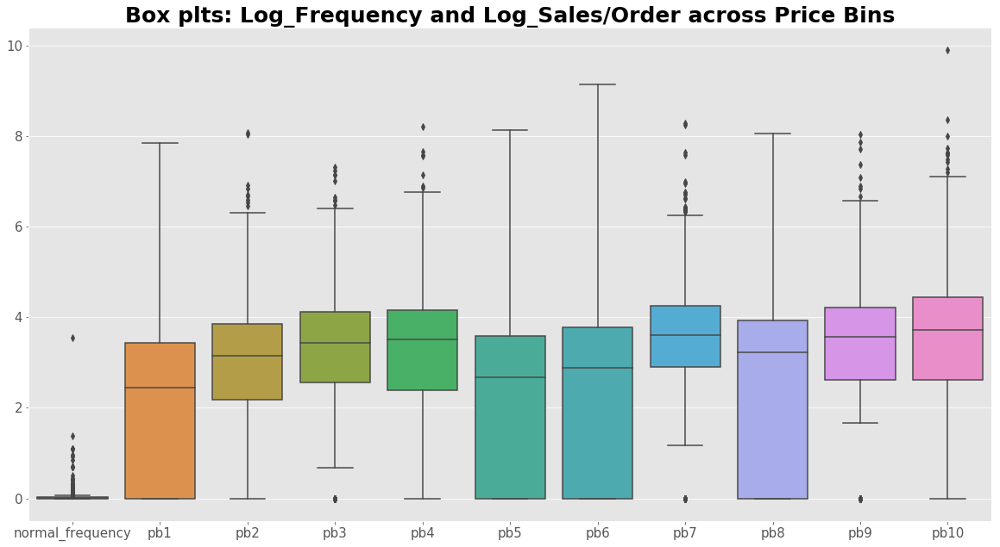

In [52]:
# Observe the distribution of data in more details:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.boxplot(data=(df_by_customer_seg_feat+1).apply(np.log))
plt.subplots_adjust(top=.92)
ax.set_title('Box plts: Log_Frequency and Log_Sales/Order across Price Bins',fontweight='bold', fontsize=25)


Text(0.5, 1.0, 'Box plts: (Unit transformed) Log_Frequency and Log_Sales/Order across Price Bins')

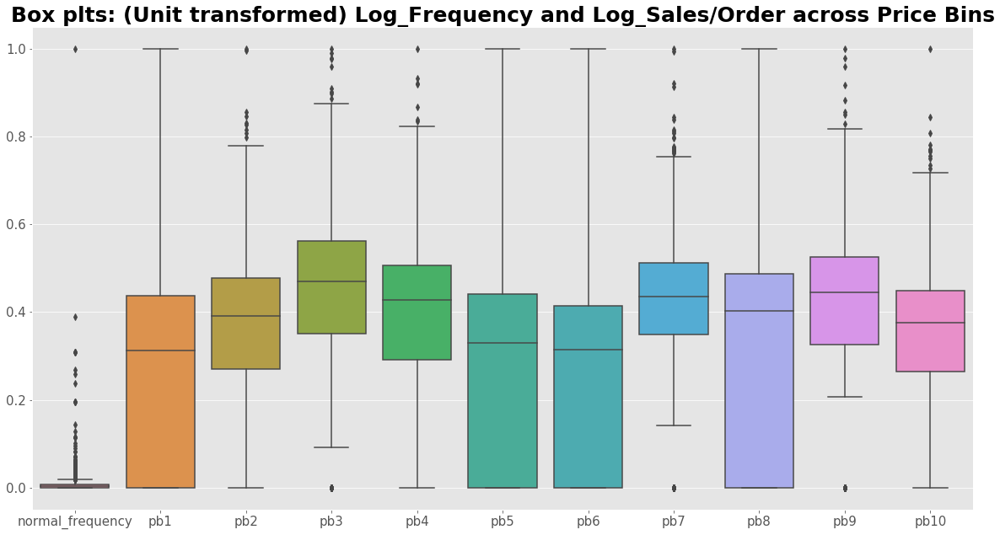

In [53]:
# Unit Transform the data to be able to see Frequency more clearly:
df_unit_transform = ((df_by_customer_seg_feat+1).apply(np.log) - (df_by_customer_seg_feat+1).apply(np.log).min())/\
                    ((df_by_customer_seg_feat+1).apply(np.log).max() - (df_by_customer_seg_feat+1).apply(np.log).min())
# Visualize:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.boxplot(data=(df_unit_transform))
plt.subplots_adjust(top=.92)
ax.set_title('Box plts: (Unit transformed) Log_Frequency and Log_Sales/Order across Price Bins',fontweight='bold', fontsize=25)

Text(0.5, 1.0, 'Box plts: (Z-standardized) Log_Frequency and Log_Sales/Order across Price Bins')

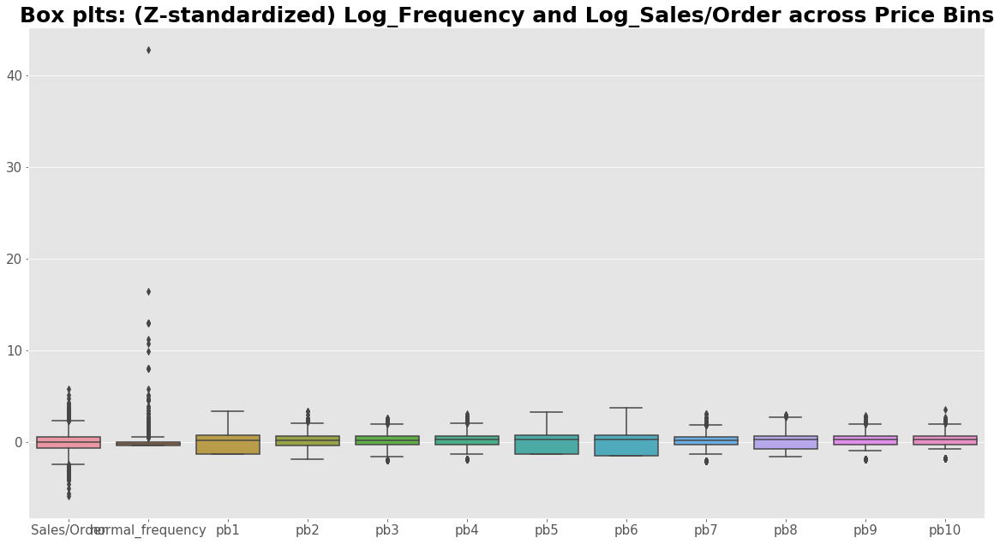

In [54]:
# Z_standardize the data to be able to see Frequency more clearly:
df_z_standardize = ((df_by_customer_seg.iloc[:,4:]+1).apply(np.log) - (df_by_customer_seg.iloc[:,4:]+1).apply(np.log).mean())/\
                    ((df_by_customer_seg.iloc[:,4:]+1).apply(np.log).std())
# Visualize:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.boxplot(data=(df_z_standardize))
plt.subplots_adjust(top=.92)
ax.set_title('Box plts: (Z-standardized) Log_Frequency and Log_Sales/Order across Price Bins',fontweight='bold', fontsize=25)

__Final choice for the data transformation method: Remove outliers + Robust Quantile Scaler + Log__

Finally, before using PCA, Kmeans and other methods, we decided transform the data by removing outliers based on IQR approach, applying a quantile based scaler and then taking log to normalize and descale the data.

The following steps explain how we arrived at this transformation. We remove outliers, then apply robest scaler (based on quantile) and then take log of the data.


In [55]:
# Remove outliers: robust methods
Q1 = df_by_customer_seg_feat.quantile(0.25)
Q3 = df_by_customer_seg_feat.quantile(0.75)
IQR = Q3 - Q1
whis = 4.5
df_by_customer_seg_out = df_by_customer_seg_feat[~((df_by_customer_seg_feat < (Q1 - whis * IQR)) |\
                               (df_by_customer_seg_feat > (Q3 + whis * IQR))).any(axis=1)]

In [161]:
# Dataframe summary:
df_by_customer_seg_out.describe()

,normal_frequency,pb1,pb2,pb3,pb4,pb5,pb6,pb7,pb8,pb9,pb10
count,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000
mean,0.017365,19.413599,30.711360,40.155036,41.357143,22.369109,28.815228,46.933073,33.934735,45.481717,59.421628
std,0.022481,25.349703,31.930692,39.448210,43.054989,29.666406,36.602407,44.144920,39.706376,45.443837,66.902823
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,8.200000,12.500000,11.350000,0.000000,0.000000,17.662500,3.250000,14.850000,14.950000
50%,0.012500,10.500000,21.420000,30.000000,30.837500,13.520000,16.800000,35.400000,23.700000,34.650000,39.950000
75%,0.025000,28.092000,42.826667,58.450000,58.600000,31.915000,40.114286,65.431667,46.200000,63.816667,81.028571
max,0.146341,158.880000,212.640000,269.932500,273.150000,190.700000,228.800000,290.400000,266.640000,297.150000,400.500000


Text(0.5, 1.0, 'Box plts: (Xoutliers) Frequency and Sales/Order across Price Bins')

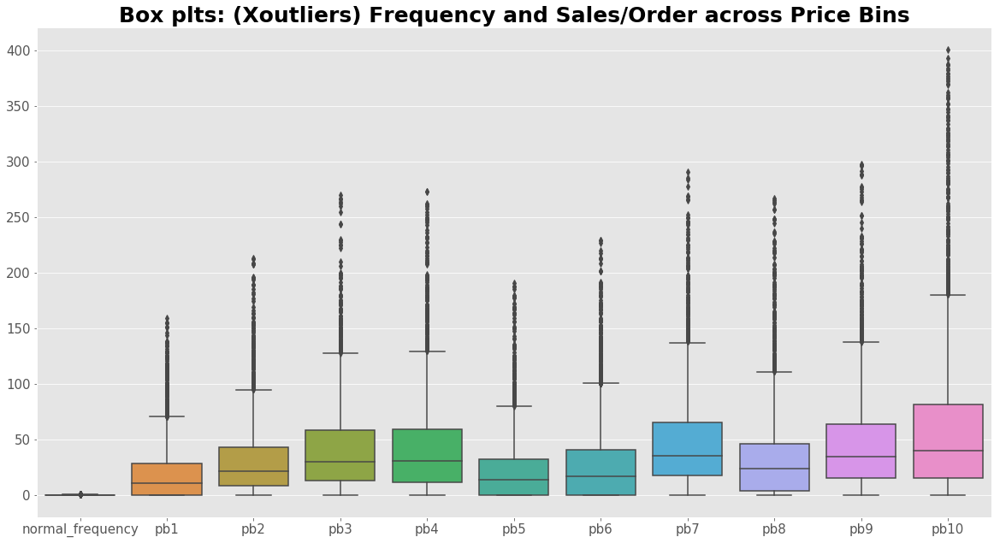

In [56]:
# Visualize:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.boxplot(data=(df_by_customer_seg_out))
plt.subplots_adjust(top=.92)
ax.set_title('Box plts: (Xoutliers) Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=25)

Text(0.5, 1.0, 'Box plts: (Xoutliers + Robust Scaler) Frequency and Sales/Order across Price Bins')

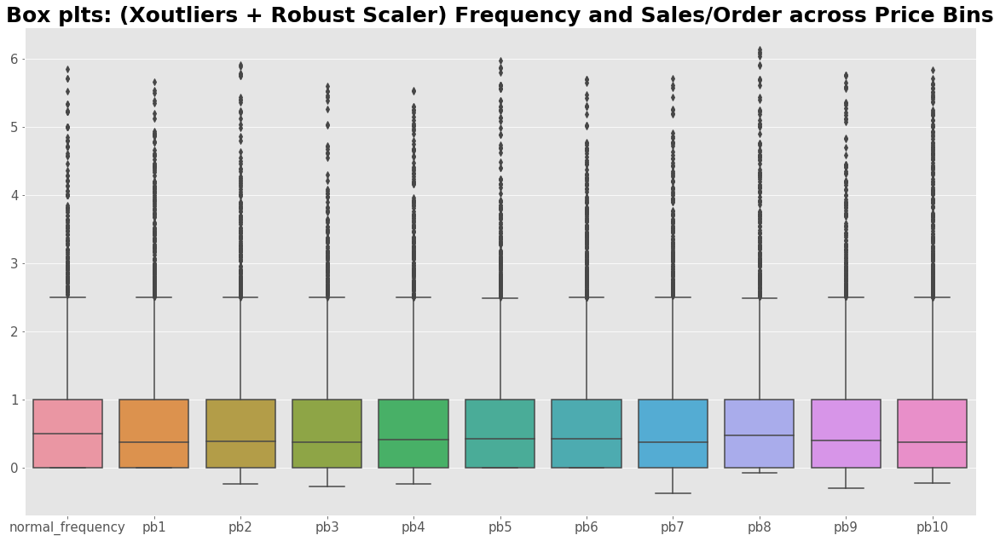

In [59]:
# Visualize:
# Robust Scaler the data to be able to see Frequency more clearly:
df_xoutliers_robust = (df_by_customer_seg_out - df_by_customer_seg_out.quantile(0.25))/\
                    (df_by_customer_seg_out.quantile(0.75) - df_by_customer_seg_out.quantile(0.25))
# Visualize:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.boxplot(data=(df_xoutliers_robust))
plt.subplots_adjust(top=.92)
ax.set_title('Box plts: (Xoutliers + Robust Scaler) Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=25)

Text(0.5, 1.0, 'Box plts: (Xoutliers + Robust Scaler + Log) Frequency and Sales/Order across Price Bins')

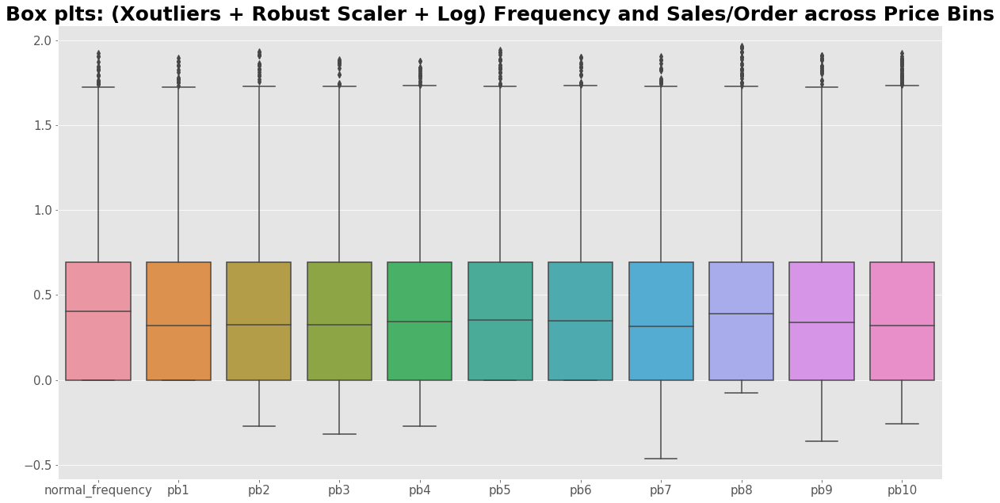

In [60]:
# Visualize:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.boxplot(data=((df_xoutliers_robust+1).apply(np.log)))
plt.subplots_adjust(top=.92)
ax.set_title('Box plts: (Xoutliers + Robust Scaler + Log) Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=25)

We can see that data is much less skewed now than before and we can check this by looking at the pairplot matrix.

Text(0.5, 0.98, 'Pairwise correlation and Distribbution: Frequency and Sales/Order across Price Bins')

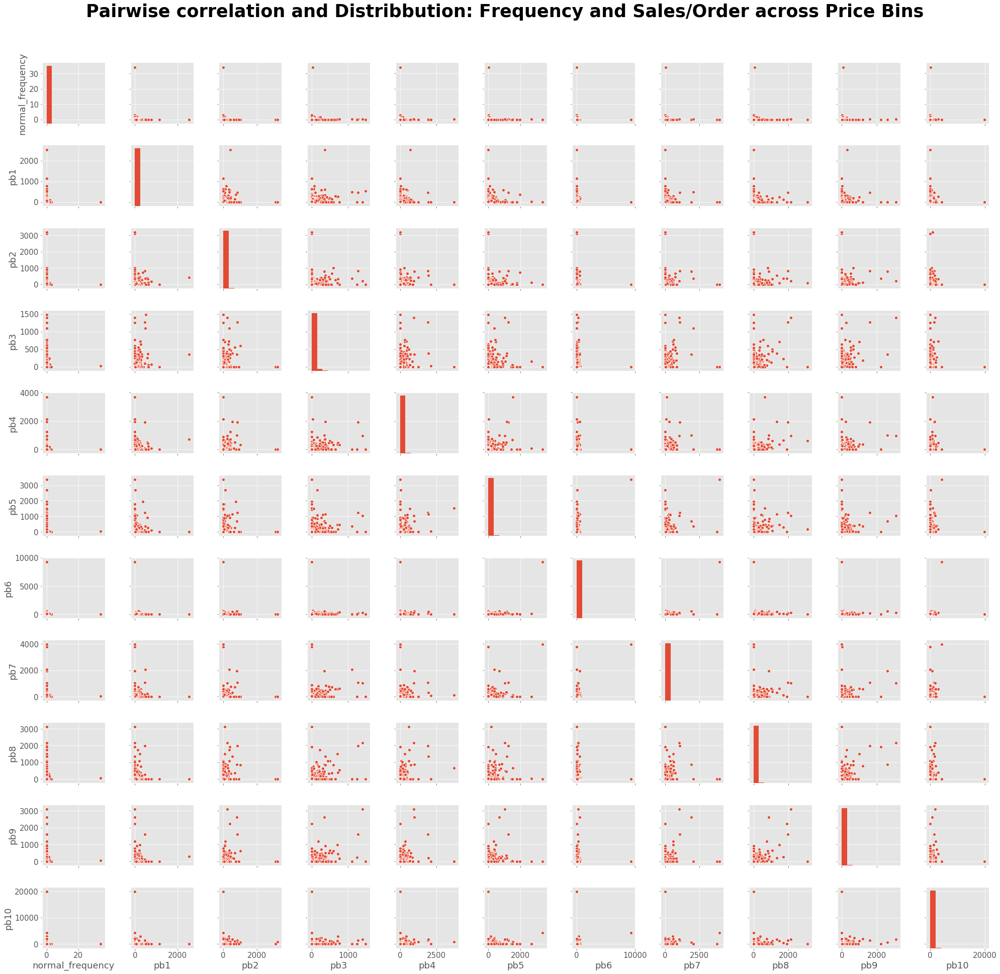

In [61]:
# Visualize distribution and correlation on pairplots:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.pairplot(df_by_customer_seg_feat)
plt.subplots_adjust(top=.92)
ax.fig.suptitle('Pairwise correlation and Distribbution: Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=35)

Next we will apply the transformation as shown in the Box plots analysis. We can see the transformation makes the data much clearer to read and the distribution is closer to normal, even though still very far from normality.

Text(0.5, 0.98, 'Pairwise correlation and Distribbution: (Xoutliers + Robust + Log) Frequency and Sales/Order across Price Bins')

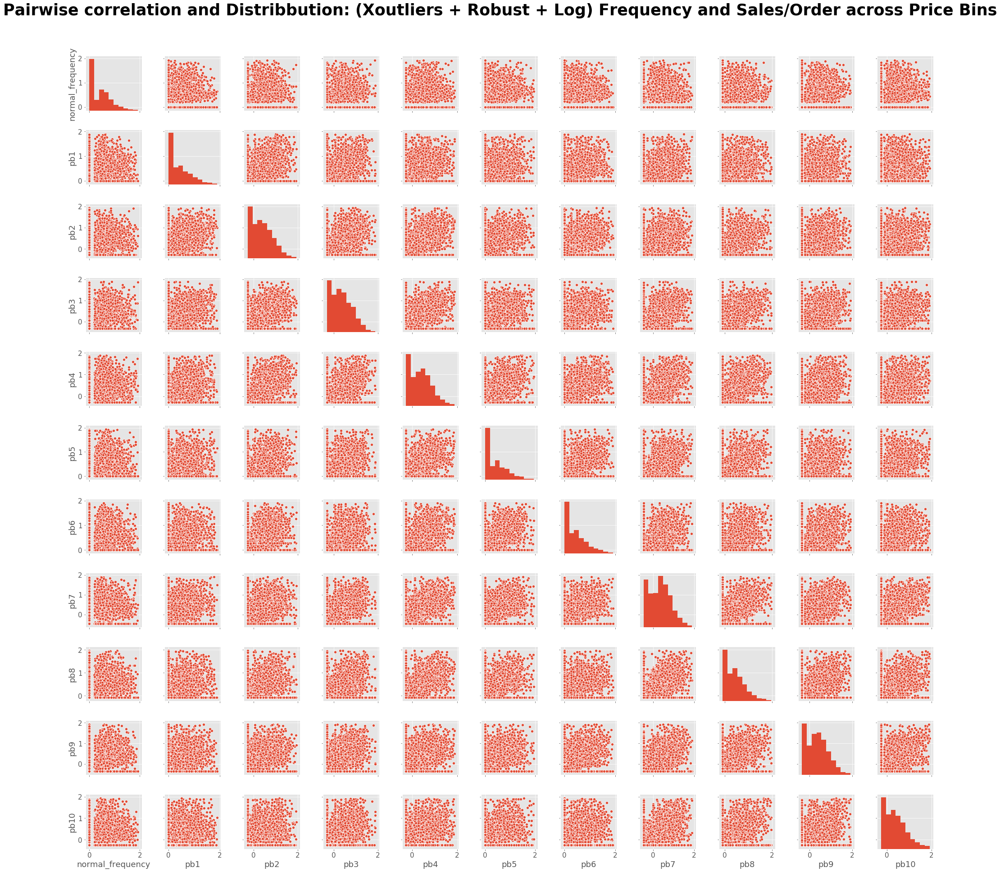

In [269]:
# Visualize distribution and correlation on pairplots: (Log)
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.pairplot((df_xoutliers_robust+1).apply(np.log)) # add 1 to be able to take log
plt.subplots_adjust(top=.92)
ax.fig.suptitle('Pairwise correlation and Distribbution: (Xoutliers + Robust + Log) Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=35)

### 3.3 Feature importance using dimension reduction

__PCA:__

We can now try applying PCA to the dataset with the aim of finding the variables that capture most of the variance in customers' purchase behaviour. First we want to measure how many Principal Components (PCs) are enough to explain most variance in the data.

We need to create a new dataframe with the following transfomrations: removing outliers, robust scaling and log-normalization:

In [62]:
df_transformed = (df_xoutliers_robust+1).apply(np.log)
df_transformed.describe()

,normal_frequency,pb1,pb2,pb3,pb4,pb5,pb6,pb7,pb8,pb9,pb10
count,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000
mean,0.422215,0.420227,0.374604,0.350671,0.367152,0.421614,0.437070,0.337445,0.431430,0.350524,0.376281
std,0.434287,0.431258,0.486797,0.479722,0.482941,0.440167,0.429774,0.523954,0.440012,0.509080,0.501969
min,0.000000,0.000000,-0.270250,-0.317502,-0.274715,0.000000,0.000000,-0.461634,-0.078685,-0.361354,-0.256501
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.405465,0.317560,0.323377,0.322698,0.345314,0.353207,0.349814,0.315772,0.389427,0.339579,0.320878
75%,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147
max,1.924783,1.895474,1.932118,1.887441,1.878050,1.942368,1.902660,1.903523,1.964659,1.911784,1.922016


In [231]:
# Matrix to fit into models:
Matrix = df_transformed.values
seed = 5

# Run PCA:
n_components = 11
pca = PCA(n_components)
projectedAxes = pca.fit_transform(Matrix)

Text(0.5, 1.0, 'Cummulative and Individual Variance by Principal of Components')

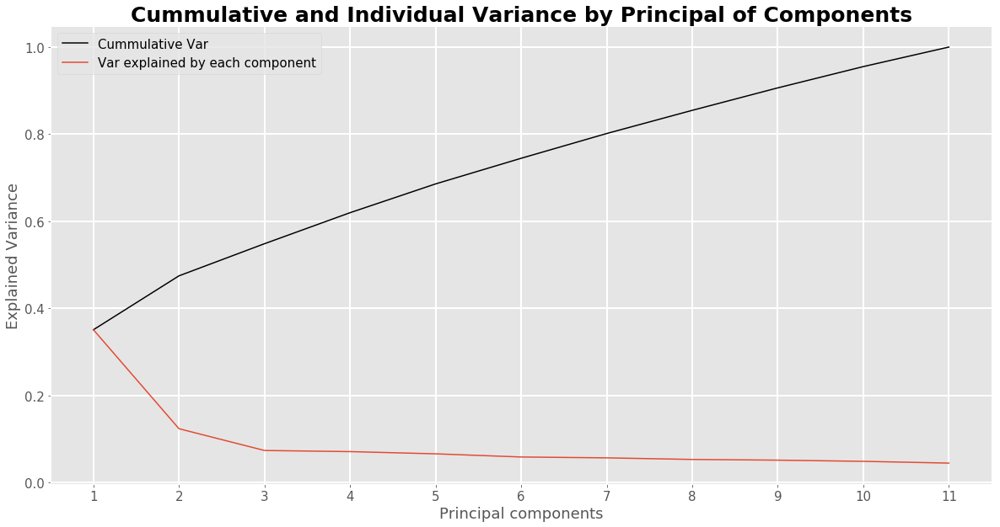

In [270]:
plt.rcParams['font.size'] = 15
f, ax = plt.subplots(figsize=(20,10))
ax = plt.plot(np.arange(1,n_components+1), pca.explained_variance_ratio_.cumsum(), label='PCA', c='black') 
#plt.title('Explained Variance by number of components')
ax = plt.plot(np.arange(1,n_components+1),pca.explained_variance_ratio_)
plt.xlabel('Principal components')
plt.xticks(np.arange(1, n_components+1, step=1))   
plt.ylabel('Explained Variance')
plt.grid(linestyle='-', linewidth=2)
plt.legend(['Cummulative Var', 'Var explained by each component'],loc='upper left')
plt.title('Cummulative and Individual Variance by Principal of Components',fontweight='bold', fontsize=25)

It appears that we need at least 6 PCs in order to explain nearly 75% variance in the data.

Text(0.5, 1.0, 'PCA Loadings for each component')

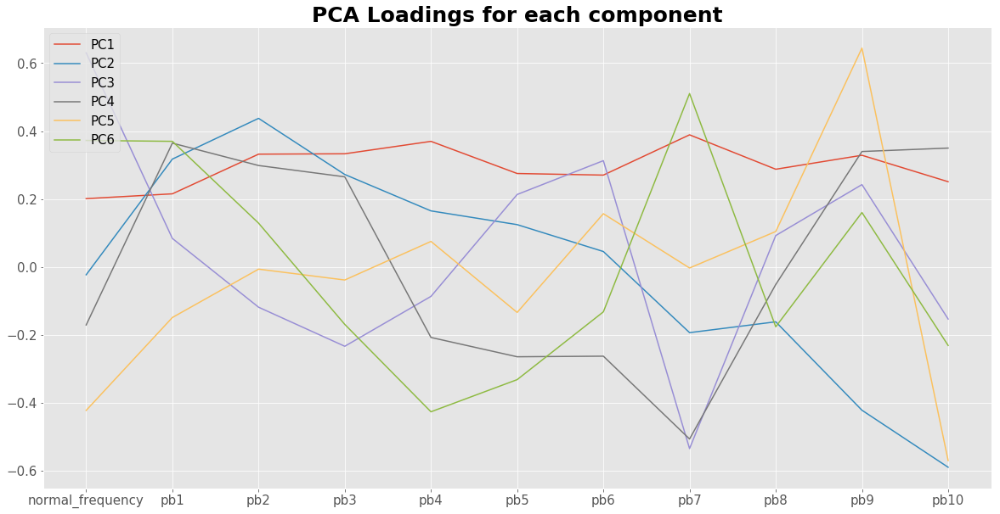

In [271]:
# Plot the loadings of PCA for different components

plt.rcParams['font.size'] = 15
f, ax = plt.subplots(figsize=(20,10))
ind_pc = np.array([x for x, _ in enumerate(list(df_transformed.columns.values))])
ax = plt.plot(ind_pc, pca.components_[0][0:11])
ax = plt.plot(ind_pc, pca.components_[1][0:11])
ax = plt.plot(ind_pc, pca.components_[2][0:11])
ax = plt.plot(ind_pc, pca.components_[3][0:11])
ax = plt.plot(ind_pc, pca.components_[4][0:11])
ax = plt.plot(ind_pc, pca.components_[5][0:11])
plt.legend(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'], loc='upper left')
plt.xticks(ind_pc,labels=('normal_frequency', 'pb1','pb2','pb3','pb4'
                , 'pb5', 'pb6', 'pb7', 'pb8', 'pb9', 'pb10'))
plt.title('PCA Loadings for each component',fontweight='bold', fontsize=25)


There does not seem to be a clear relatonship amongst the variables to be able to exclude any of them out of our analysis. 

__Apply Sparse PCA:__

SparsePCA is similar to PCA but puts more emphasis on key variables and masks the less important variables as zeros, so that the contribution of the most important variables would be more easily distinguished.

Based on Sparse PCA, variable pb4 has the highest importance, followed by pb10, normal frequency, pb1, pb9, pb7, pb3 and pb8.

In [151]:
from sklearn.decomposition import SparsePCA
s_pca = SparsePCA(n_components=n_components, random_state=seed, normalize_components=True)
Sparse_PCA_embdedded = s_pca.fit_transform(Matrix)

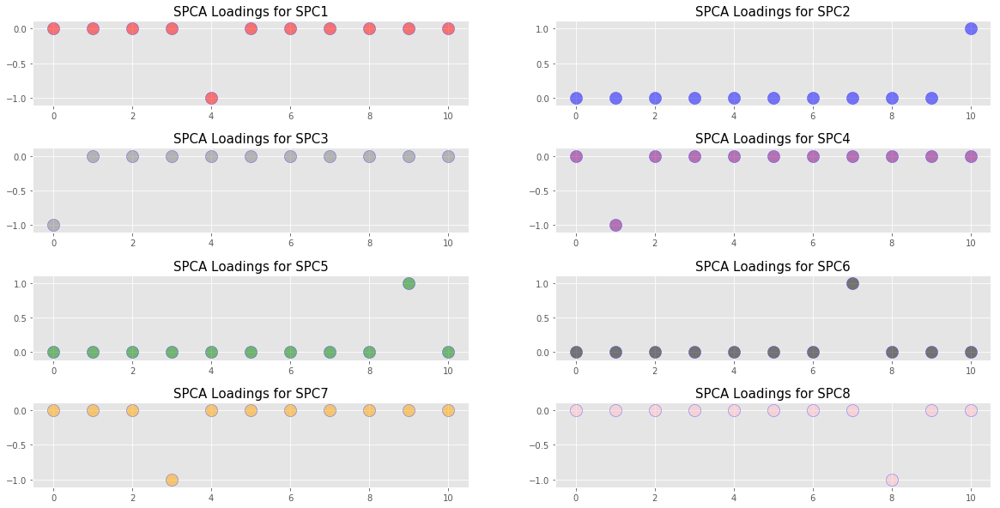

In [280]:
#plt.rcParams['font.size'] = 15
ind_pc = np.array([x for x, _ in enumerate(list(df_transformed.columns.values))])
f, ((ax1,ax2),(ax3,ax4),(ax5,ax6),(ax7,ax8)) = plt.subplots(4,2, figsize=(20,10))
ax1.scatter(ind_pc, s_pca.components_[0][0:11],marker='o', alpha=0.5, s=200, edgecolors='b', color='red')
ax1.set_title('SPCA Loadings for SPC1', fontsize=15)
ax2.scatter(ind_pc, s_pca.components_[1][0:11], marker='o', alpha=0.5, s=200, edgecolors='b', color='blue')
ax2.set_title('SPCA Loadings for SPC2', fontsize=15)
ax3.scatter(ind_pc, s_pca.components_[2][0:11], marker='o', alpha=0.5, s=200, edgecolors='b', color='gray')
ax3.set_title('SPCA Loadings for SPC3', fontsize=15)
ax4.scatter(ind_pc, s_pca.components_[3][0:11], marker='o', alpha=0.5, s=200, edgecolors='b', color='purple')
ax4.set_title('SPCA Loadings for SPC4', fontsize=15)
ax5.scatter(ind_pc, s_pca.components_[4][0:11], marker='o', alpha=0.5, s=200, edgecolors='b', color='green')
ax5.set_title('SPCA Loadings for SPC5', fontsize=15)
ax6.scatter(ind_pc, s_pca.components_[5][0:11], marker='o', alpha=0.5, s=200, edgecolors='b', color='black')
ax6.set_title('SPCA Loadings for SPC6', fontsize=15)
ax7.scatter(ind_pc, s_pca.components_[6][0:11], marker='o', alpha=0.5, s=200, edgecolors='b', color='orange')
ax7.set_title('SPCA Loadings for SPC7', fontsize=15)
ax8.scatter(ind_pc, s_pca.components_[7][0:11], marker='o', alpha=0.5, s=200, edgecolors='b', color='pink')
ax8.set_title('SPCA Loadings for SPC8', fontsize=15)
#plt.legend(['SPC1', 'SPC2', 'SPC3', 'SPC4', 'SPC5', 'SPC6'], loc='upper left')
#plt.xticks(ind_pc,labels=('normal_frequency', 'pb1','pb2','pb3','pb4'
#                , 'pb5', 'pb6', 'pb7', 'pb8', 'pb9', 'pb10'))
plt.subplots_adjust(hspace=0.5)
#plt.title('SPCA Loadings for each component',fontweight='bold', fontsize=25)

### 3.4 Clustering appications & evaluation

__Kmeans clustering__

Kmeans is applied here because the method can be used for unsupervised machine learning problems, which is relevant for our case. The method also has other benefits such as fast computation, good for spherical data sets and also relatively simpler to interpret than some other methods.

However, the drawbacks of Kmeans include that the resulting clusters may be very different depending on the initial choice of centroids locations. To deal with this matther, we have chosen a fixed number for random seed. In addition, we choose the initialisation method 'k-means++'. To choose the number of clusters, we use Silhouette score.

In [276]:
# K-means
# We will assess how many clusters to assign to the data using Silhouette score:
range_n_clusters = np.arange(2,20)
silhouette_scores = []
for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=seed, init='k-means++', n_init=100)
    cluster_labels = clusterer.fit_predict(Matrix)
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Matrix, cluster_labels)
#    print("For n_clusters =", n_clusters,
#          "The average silhouette_score is :", silhouette_avg)
    silhouette_scores.append(silhouette_avg)

Text(0.5, 1.0, 'Kmeans: Silhouette Scores by Number of Clusters')

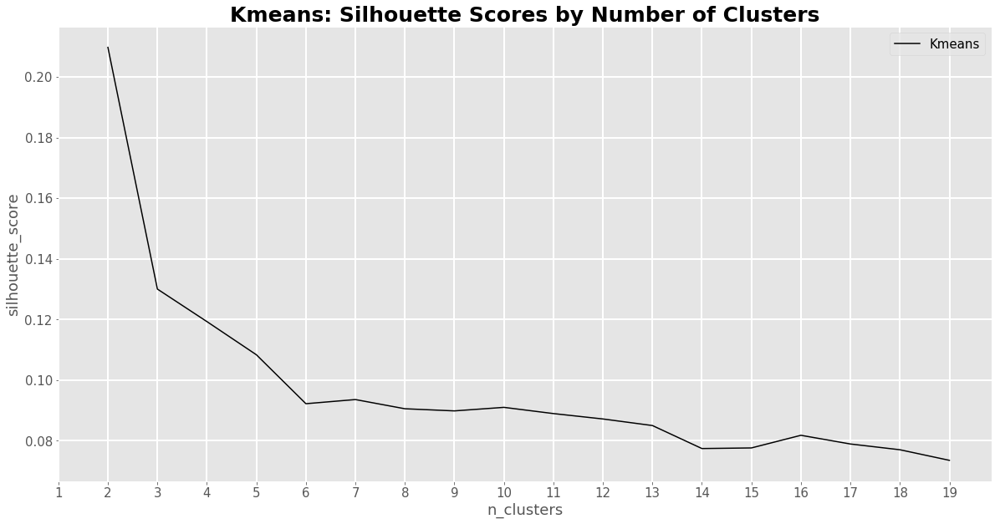

In [277]:
# Plot the result:      
plt.rcParams['font.size'] = 15
plt.plot(range_n_clusters, silhouette_scores, label='Kmeans', c='black')
plt.legend(loc='best')
plt.xlabel('n_clusters')
plt.xticks(np.arange(1, max(range_n_clusters)+1, step=1)) 
plt.ylabel('silhouette_score')
plt.grid(linestyle='-', linewidth=2)
plt.title('Kmeans: Silhouette Scores by Number of Clusters',fontweight='bold', fontsize=25)

Here we would try only use the first 6 features in order  of importance suggested by the SPCA method from earlier. These features are:

In [415]:
df_x_pb2_3_8_6 = df_transformed[['normal_frequency','pb1', 'pb4', 'pb7'\
                                               ,'pb9','pb10']]

df_x_pb2_3_8_6.describe()

,normal_frequency,pb1,pb4,pb7,pb9,pb10
count,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000,3477.000000
mean,0.422215,0.420227,0.367152,0.337445,0.350524,0.376281
std,0.434287,0.431258,0.482941,0.523954,0.509080,0.501969
min,0.000000,0.000000,-0.274715,-0.461634,-0.361354,-0.256501
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.405465,0.317560,0.345314,0.315772,0.339579,0.320878
75%,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147
max,1.924783,1.895474,1.878050,1.903523,1.911784,1.922016


In [416]:
Matrix_x_2386 = df_x_pb2_3_8_6.values
range_n_clusters = np.arange(2,20)
silhouette_scores = []
for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=seed, init='k-means++', n_init=100)
    cluster_labels = clusterer.fit_predict(Matrix_x_2386)
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Matrix_x_2386, cluster_labels)
#    print("For n_clusters =", n_clusters,
#          "The average silhouette_score is :", silhouette_avg)
    silhouette_scores.append(silhouette_avg)

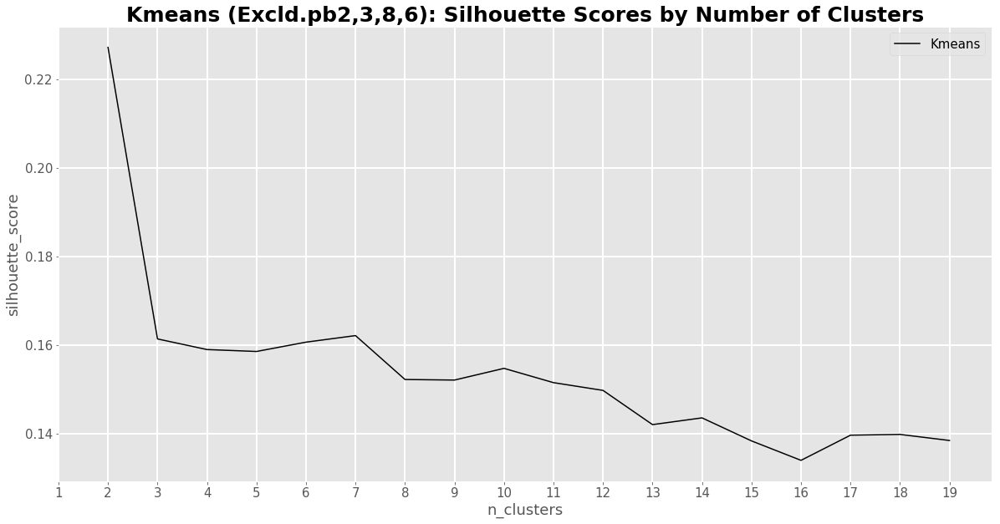

In [417]:
# Plot the result:      
plt.rcParams['font.size'] = 15;
plt.plot(range_n_clusters, silhouette_scores, label='Kmeans', c='black')
plt.legend(loc='best');
plt.xlabel('n_clusters');
plt.xticks(np.arange(1, max(range_n_clusters)+1, step=1));
plt.ylabel('silhouette_score');
plt.grid(linestyle='-', linewidth=2);
plt.title('Kmeans (Excld.pb2,3,8,6): Silhouette Scores by Number of Clusters',fontweight='bold', fontsize=25);

The result slightly improves but not by a huge margin. Therefore we dont need to discard any feature.

Next we will visualize the data in a 3D space based on the PCA analysis, the first three Principal components capture nearly 60% of the variance in the dataset.

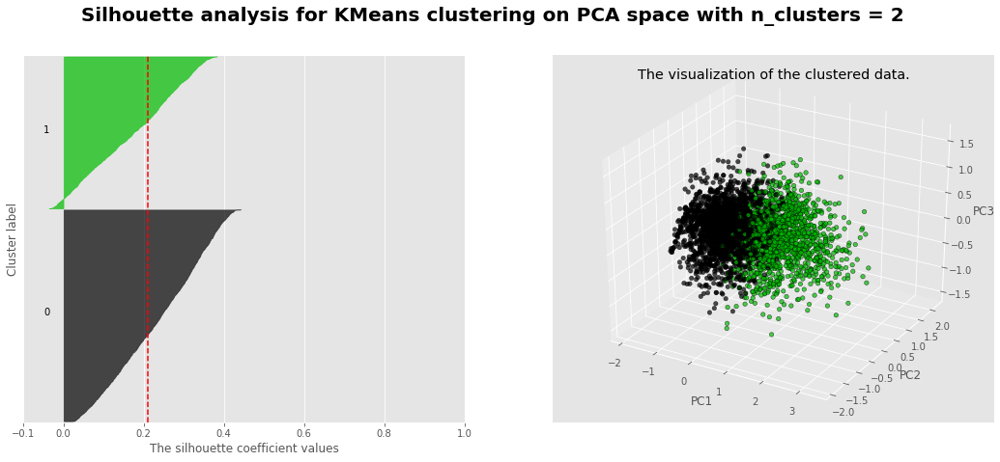

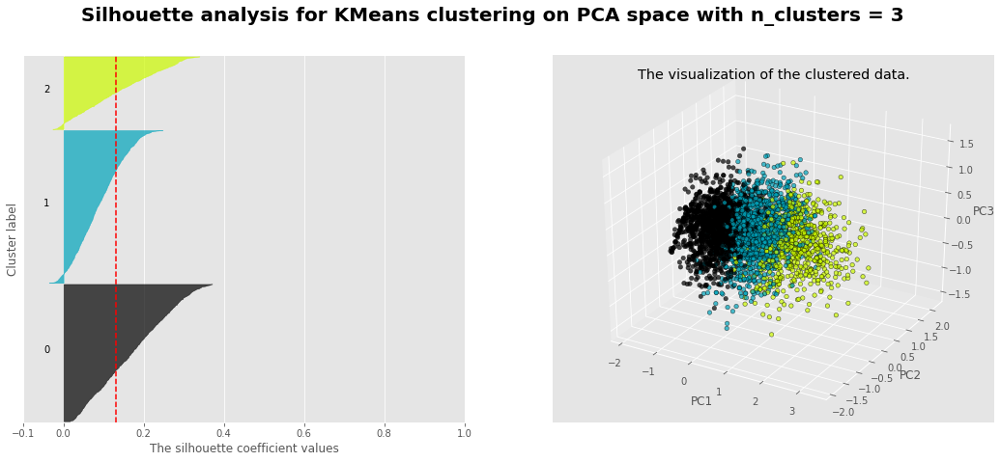

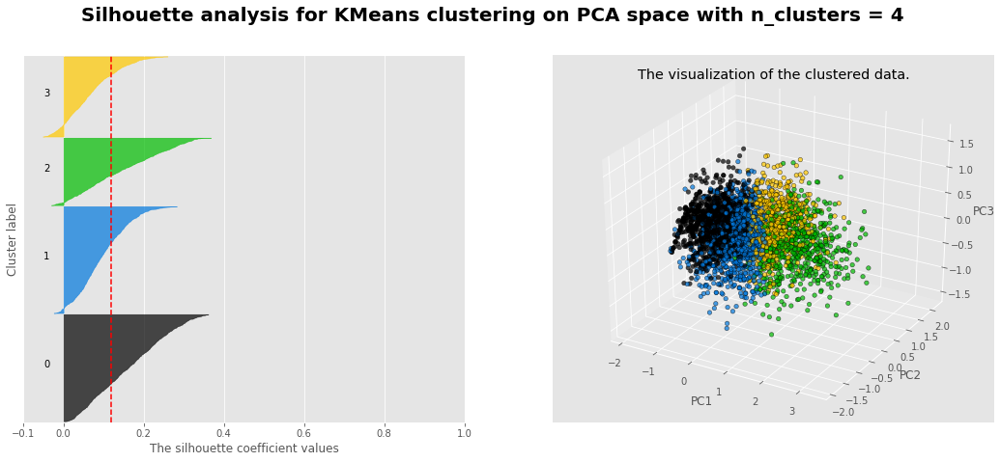

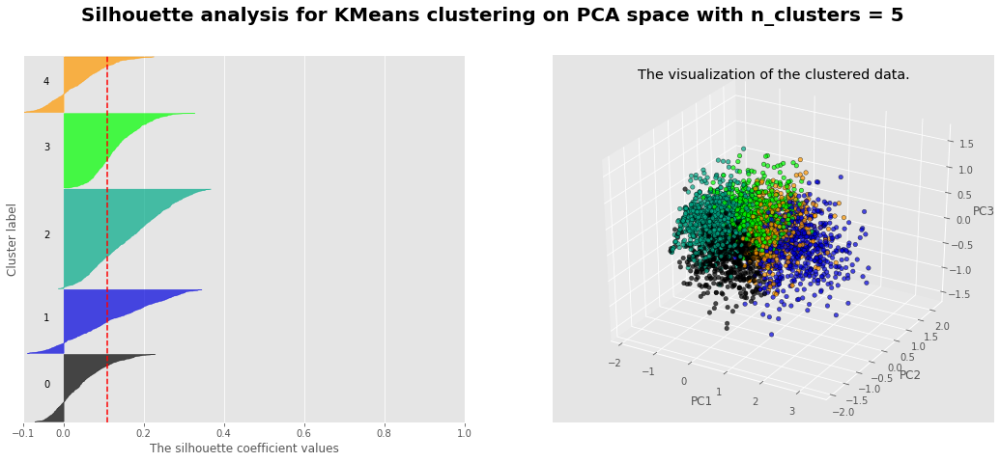

In [367]:
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['font.size'] = 10;
range_n_clusters = np.arange(2,6)
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    # Set up a figure twice as tall as it is wide
    fig = plt.figure(figsize=plt.figaspect(2.));
    fig.suptitle(("Silhouette analysis for KMeans clustering on PCA space "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=20, fontweight='bold');
    #fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7);
    
    #fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(1,2,1);
    ax.set_xlim([-0.1, 1]);
    ax.set_ylim([0, len(Matrix) + (n_clusters + 1) * 10]);

    clusterer = KMeans(n_clusters=n_clusters, random_state=seed, n_init = 50, init='k-means++')
    cluster_labels = clusterer.fit_predict(Matrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Matrix, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Matrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i));

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    #ax1.set_title("The silhouette plot for the various clusters.")
    ax.set_xlabel("The silhouette coefficient values");
    ax.set_ylabel("Cluster label");

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--");

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1]);
    
    # 2nd Plot showing the actual clusters formed
    ax = fig.add_subplot(1,2,2, projection='3d');
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax.scatter3D(projectedAxes[:, 0], projectedAxes[:, 1], projectedAxes[:, 2],\
                c = colors, cmap='Set1', edgecolor='none', alpha=0.7)
    
    ax.set_title("The visualization of the clustered data.");
    ax.set_xlabel("PC1");
    ax.set_ylabel("PC2");
    ax.set_zlabel("PC3");
    

The data appears to be very dense in this space. We can try to project the data in the Sparse PCA space calculated in section 3.3 to see if the data become less dense.

Text(0.5, 0.98, 'Silhouette analysis for KMeans clustering on SPCA space with n_clusters = 2')

(-0.1, 1)

(0, 3507)

Text(-0.05, 1021.5, '0')

Text(-0.05, 2770.0, '1')

Text(0.5, 0, 'The silhouette coefficient values')

Text(0, 0.5, 'Cluster label')

[]

Text(0.5, 0.92, 'The visualization of the clustered data.')

Text(0.5, 0, 'SPC1')

Text(0.5, 0, 'SPC2')

Text(0.5, 0, 'SPC3')

Text(0.5, 0.98, 'Silhouette analysis for KMeans clustering on SPCA space with n_clusters = 3')

(-0.1, 1)

(0, 3517)

Text(-0.05, 668.0, '0')

Text(-0.05, 2068.0, '1')

Text(-0.05, 3158.5, '2')

Text(0.5, 0, 'The silhouette coefficient values')

Text(0, 0.5, 'Cluster label')

[]

Text(0.5, 0.92, 'The visualization of the clustered data.')

Text(0.5, 0, 'SPC1')

Text(0.5, 0, 'SPC2')

Text(0.5, 0, 'SPC3')

Text(0.5, 0.98, 'Silhouette analysis for KMeans clustering on SPCA space with n_clusters = 4')

(-0.1, 1)

(0, 3527)

Text(-0.05, 525.0, '0')

Text(-0.05, 1563.5, '1')

Text(-0.05, 2411.5, '2')

Text(-0.05, 3131.5, '3')

Text(0.5, 0, 'The silhouette coefficient values')

Text(0, 0.5, 'Cluster label')

[]

Text(0.5, 0.92, 'The visualization of the clustered data.')

Text(0.5, 0, 'SPC1')

Text(0.5, 0, 'SPC2')

Text(0.5, 0, 'SPC3')

Text(0.5, 0.98, 'Silhouette analysis for KMeans clustering on SPCA space with n_clusters = 5')

(-0.1, 1)

(0, 3537)

Text(-0.05, 334.5, '0')

Text(-0.05, 976.0, '1')

Text(-0.05, 1772.5, '2')

Text(-0.05, 2621.5, '3')

Text(-0.05, 3259.0, '4')

Text(0.5, 0, 'The silhouette coefficient values')

Text(0, 0.5, 'Cluster label')

[]

Text(0.5, 0.92, 'The visualization of the clustered data.')

Text(0.5, 0, 'SPC1')

Text(0.5, 0, 'SPC2')

Text(0.5, 0, 'SPC3')

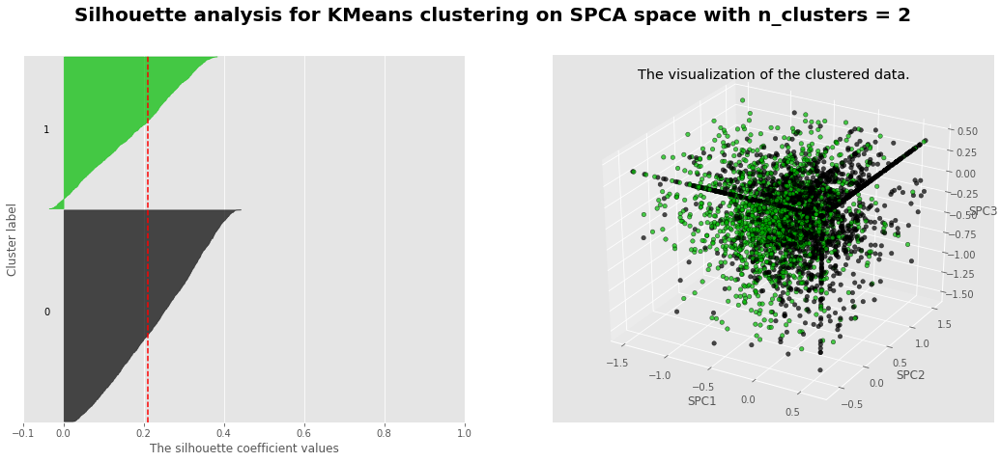

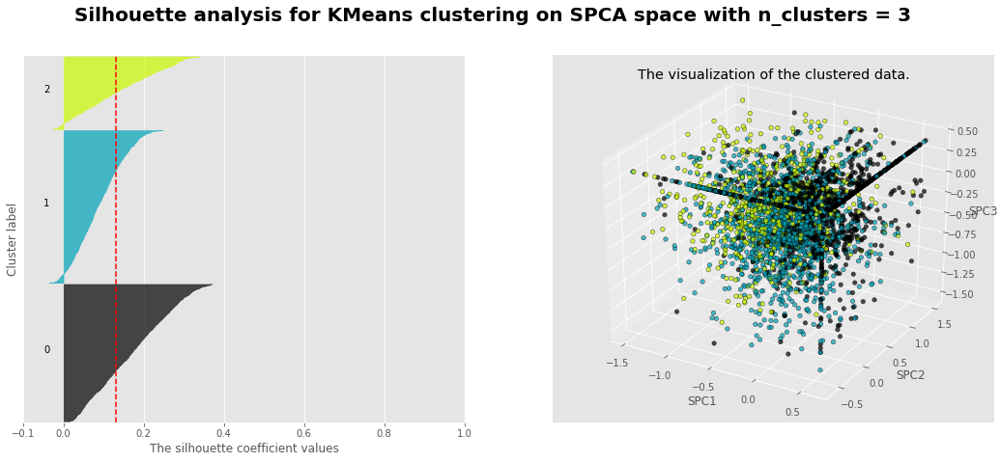

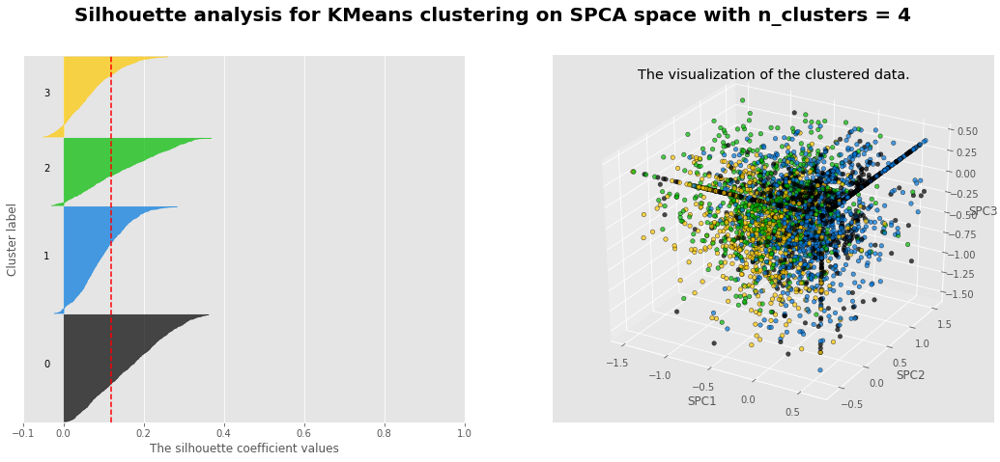

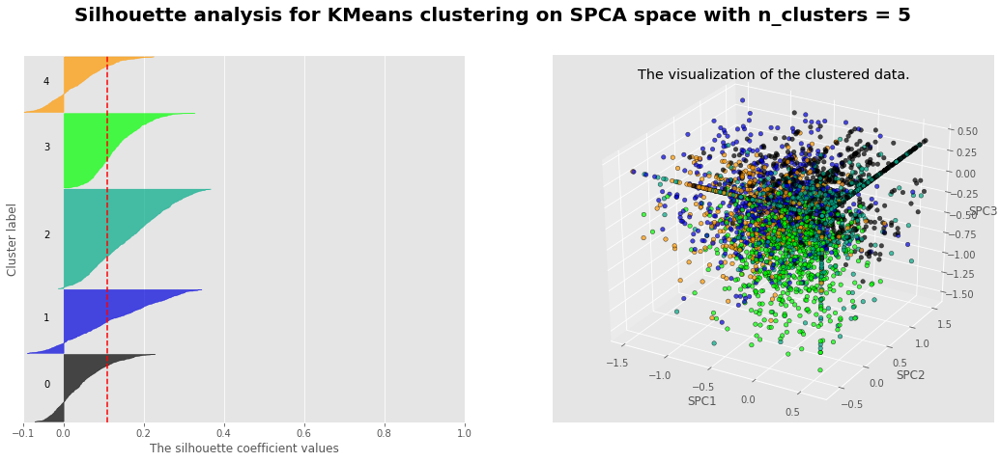

In [418]:
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['font.size'] = 10;
range_n_clusters = np.arange(2,6)
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    # Set up a figure twice as tall as it is wide
    fig = plt.figure(figsize=plt.figaspect(2.));
    fig.suptitle(("Silhouette analysis for KMeans clustering on SPCA space "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=20, fontweight='bold');
    #fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7);
    
    #fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(1,2,1);
    ax.set_xlim([-0.1, 1]);
    ax.set_ylim([0, len(Matrix) + (n_clusters + 1) * 10]);

    clusterer = KMeans(n_clusters=n_clusters, random_state=seed, n_init = 50, init='k-means++')
    cluster_labels = clusterer.fit_predict(Matrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Matrix, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Matrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7);

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i));

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    #ax1.set_title("The silhouette plot for the various clusters.")
    ax.set_xlabel("The silhouette coefficient values");
    ax.set_ylabel("Cluster label");

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--");

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1]);
    
    # 2nd Plot showing the actual clusters formed
    ax = fig.add_subplot(1,2,2, projection='3d');
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax.scatter3D(Sparse_PCA_embdedded[:, 0], Sparse_PCA_embdedded[:, 1], Sparse_PCA_embdedded[:, 2],\
                c = colors, cmap='Set1', edgecolor='none', alpha=0.7);
    
    ax.set_title("The visualization of the clustered data.");
    ax.set_xlabel("SPC1");
    ax.set_ylabel("SPC2");
    ax.set_zlabel("SPC3");

The projection in the Sparse PCA space shows much sparser data, it appears to ber hard to separate the data.


__Other clustering methods: Hierarchical Clustering__

Next, we can try applying Hierachical clustering to the dataset. While Kmeans looks for clusters with a particular shape (sphere), Hierarchical clustering does not.

We have chosen to use cosine similarity to measure the similarity between clusters. We also use cosine similarity for the Silhouette score here to make it compatible. The cosine similarity can be more effective in sparse matrices as it does not use up all dimensions of the matrix.

In [294]:
range_n_clusters = np.arange(2,20)
silhouette_scores = []
for n_clusters in range_n_clusters:
    clusterer = AgglomerativeClustering(n_clusters=n_clusters, affinity='cosine', linkage='average')  
    cluster_labels = clusterer.fit_predict(Matrix)
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Matrix, cluster_labels,metric='cosine')
#    print("For n_clusters =", n_clusters,
#          "The average silhouette_score is :", silhouette_avg)
    silhouette_scores.append(silhouette_avg)

Text(0.5, 1.0, '(Cosine similarity) Hierarchical: Silhouette Scores by Number of Clusters')

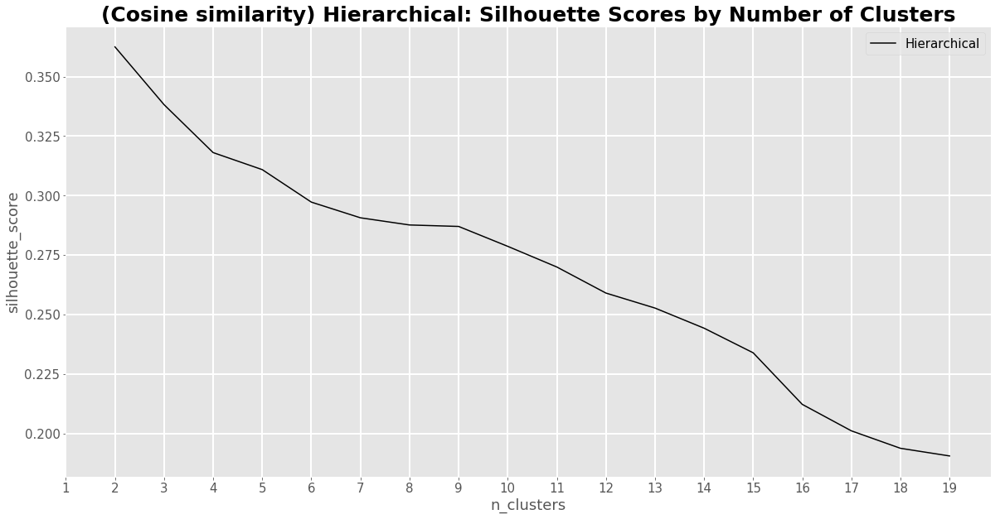

In [295]:
# Plot the result:      
plt.rcParams['font.size'] = 15
plt.plot(range_n_clusters, silhouette_scores, label='Hierarchical', c='black')
plt.legend(loc='best')
plt.xlabel('n_clusters')
plt.xticks(np.arange(1, max(range_n_clusters)+1, step=1)) 
plt.ylabel('silhouette_score')
plt.grid(linestyle='-', linewidth=2)
plt.title('(Cosine similarity) Hierarchical: Silhouette Scores by Number of Clusters',fontweight='bold', fontsize=25)

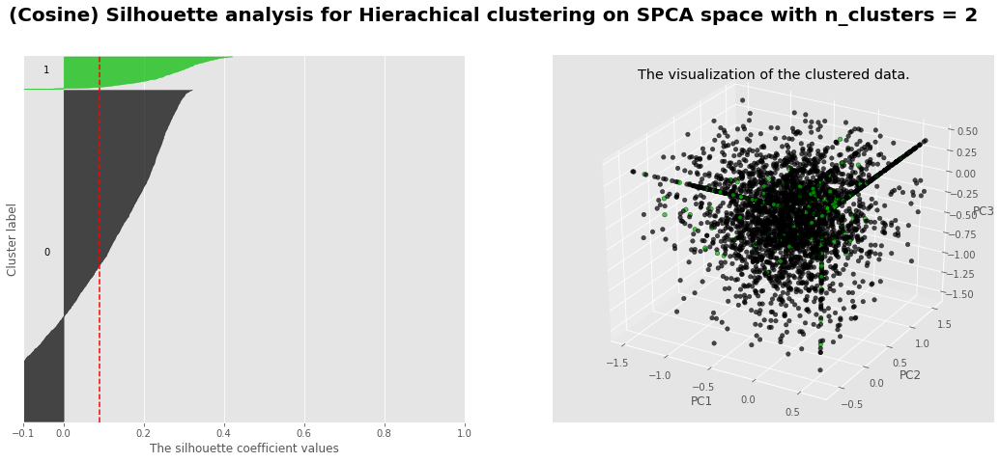

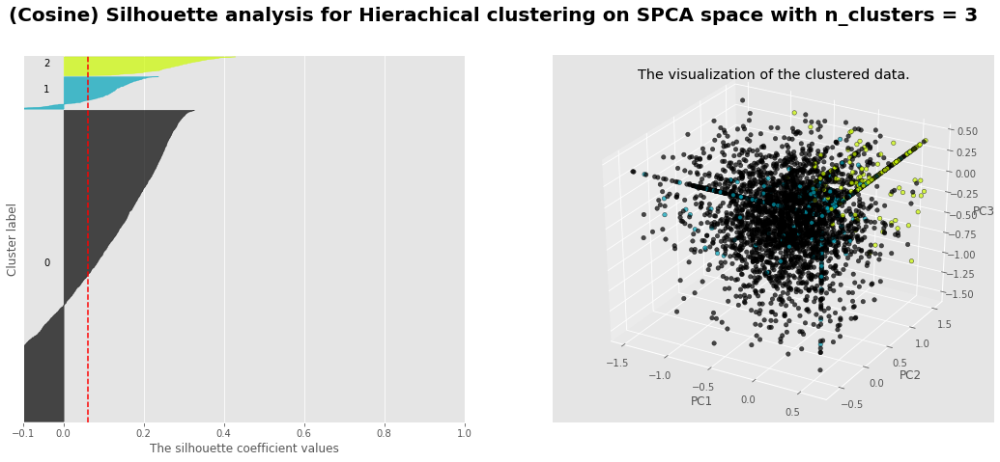

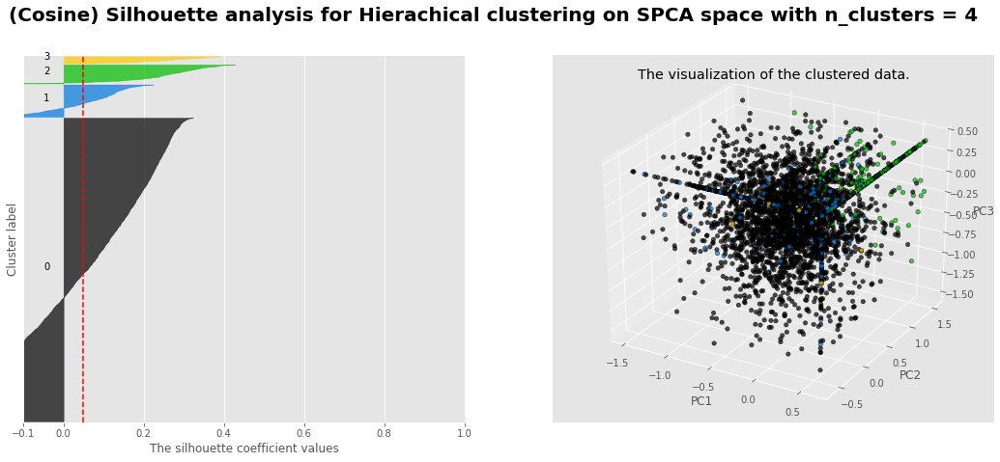

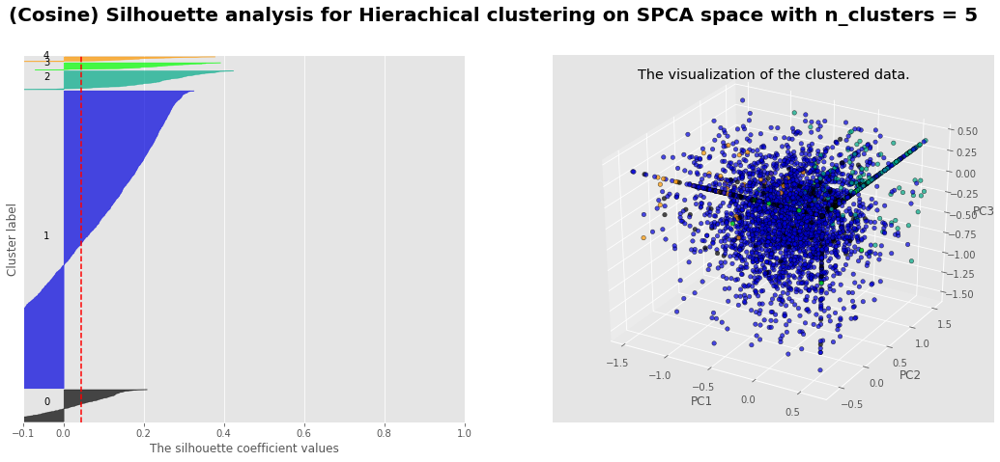

In [370]:
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['font.size'] = 10
range_n_clusters = np.arange(2,6)
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    # Set up a figure twice as tall as it is wide
    fig = plt.figure(figsize=plt.figaspect(2.))
    fig.suptitle(("(Cosine) Silhouette analysis for Hierachical clustering on SPCA space "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=20, fontweight='bold')
    #fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    #fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(1,2,1)
    ax.set_xlim([-0.1, 1])
    ax.set_ylim([0, len(Matrix) + (n_clusters + 1) * 10])

    clusterer = AgglomerativeClustering(n_clusters=n_clusters, affinity='cosine', linkage='average')  
    cluster_labels = clusterer.fit_predict(Matrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Matrix, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Matrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    #ax1.set_title("The silhouette plot for the various clusters.")
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    # 2nd Plot showing the actual clusters formed
    ax = fig.add_subplot(1,2,2, projection='3d')
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax.scatter3D(Sparse_PCA_embdedded[:, 0], Sparse_PCA_embdedded[:, 1], Sparse_PCA_embdedded[:, 2],\
                c = colors, cmap='Set1', edgecolor='none', alpha=0.7)
    
    ax.set_title("The visualization of the clustered data.")
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")

__Other clustering methods: Spectral Clustering (Non-linear, Non-convex)__


_Spectral Clustering_

Another limitation with Kmeans method as well as with dimension reduction using PCA is the assumption that clusters are seprated by linear bounderies and have convex forms. Spectral Clustering method resolves this problem.

WE apply k-nearest neighbors to compute the similarity measure. This approach reduces issues with cluster varying densities, we also choose to assign label to be 'discretize'as it is less subject to intialization. We choose eigen_solver='amg' after installing pyamg as it improves the speed of computation.

_tSNE dimension reduction_

This is a non-linear alternative to the PCA approach. Compared to MDS scaling it is more robust against non-linear embeddings of data points on the lower dimension.

In [313]:
# Use Non-linear Dimension Reduction Method:
from sklearn.manifold import TSNE, MDS
from sklearn.neighbors import DistanceMetric

n_components = 3
TSNE_Model = TSNE(n_components=n_components,\
    perplexity=50,early_exaggeration=12.0,\
    learning_rate=200.0, n_iter=1000,\
    n_iter_without_progress=300,random_state=seed,\
    metric="euclidean")
tSNE_embdedded = TSNE_Model.fit_transform(Matrix)

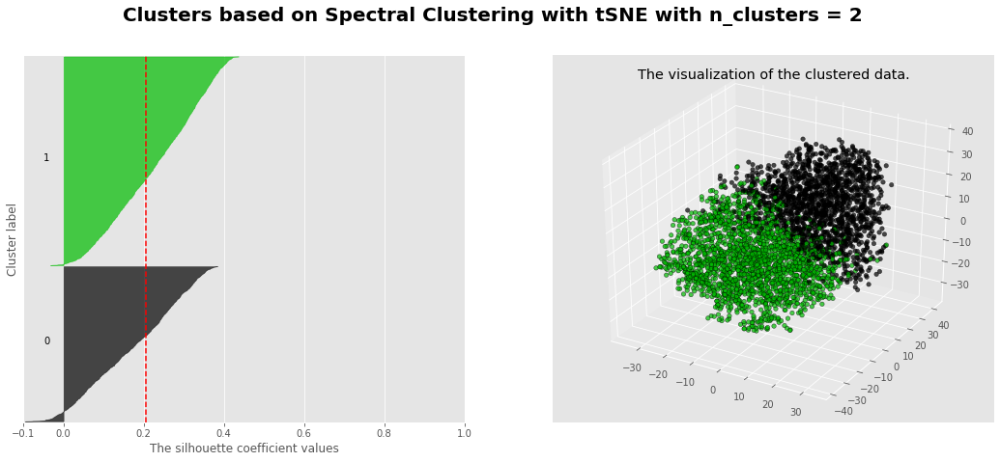

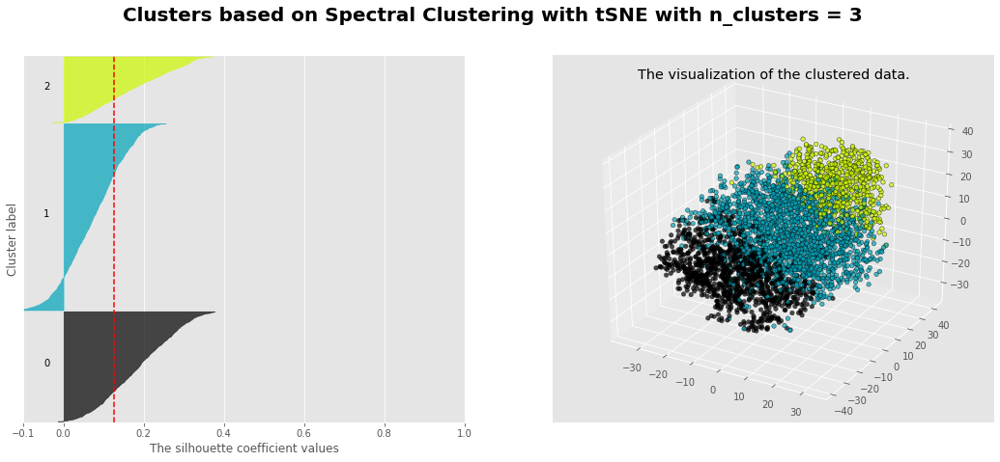

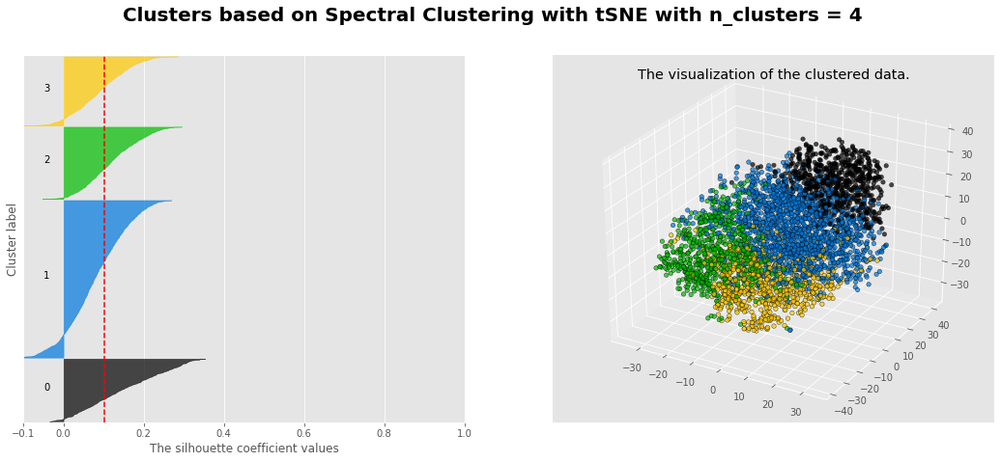

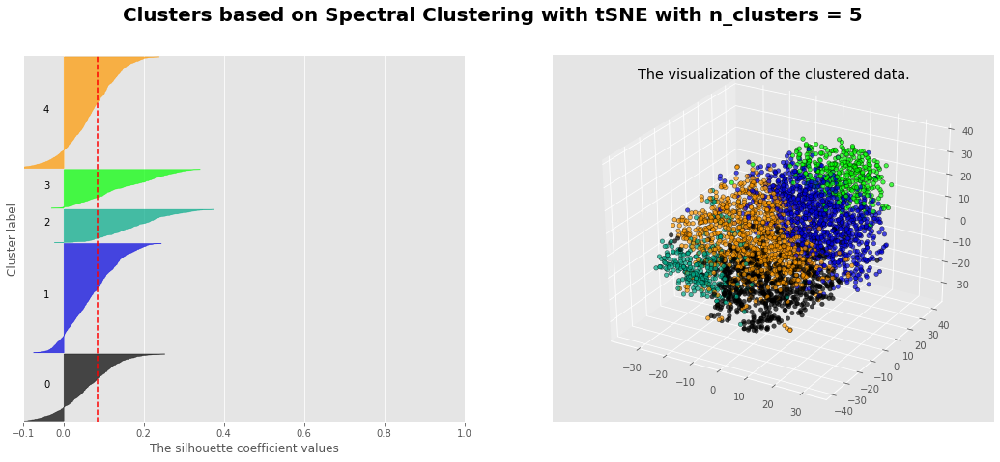

In [315]:
plt.rcParams['font.size'] = 10
range_n_clusters = np.arange(2,6)
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    # Set up a figure twice as tall as it is wide
    fig = plt.figure(figsize=plt.figaspect(2.))
    fig.suptitle(("Clusters based on Spectral Clustering with tSNE "
            "with n_clusters = %d" % n_clusters),
                 fontsize=20, fontweight='bold')
    #fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    #fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(1,2,1)
    ax.set_xlim([-0.1, 1])
    ax.set_ylim([0, len(Matrix) + (n_clusters + 1) * 10])

    clusterer = SpectralClustering(n_clusters=n_clusters, eigen_solver='amg', random_state=seed,\
        n_init=10, gamma=1, affinity='nearest_neighbors',\
        n_neighbors = 50, assign_labels='discretize')
    cluster_labels = clusterer.fit_predict(Matrix)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Matrix, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Matrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    #ax1.set_title("The silhouette plot for the various clusters.")
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    # 2nd Plot showing the actual clusters formed    
    ax = fig.add_subplot(1,2,2, projection='3d')
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax.scatter3D(tSNE_embdedded[:, 0], tSNE_embdedded[:, 1], \
                 tSNE_embdedded[:, 2], cmap='Set1',\
            c=colors, edgecolor='none', alpha=0.7)    
    ax.set_title("The visualization of the clustered data.")
#     ax.set_xlabel("PC1")
#     ax.set_ylabel("PC2")
#     ax.set_zlabel("PC3")
# plt.colorbar()

__Other clustering methods: DBSCAN (Density-based)__

We have noticed that the data is very dense even after using high-dimensional dimension reduction methods such as tSNE. Here we apply DBSCAN, a density based clustering method to assess the density of the data. 

DBSCAN cannot find points that has the same density and therefore cannot cluster the data points well. This result sugests that the density of the data is not homogenous.

Estimated number of clusters: 7
Estimated number of noise points: 3252
Silhouette Coefficient: -0.300


Text(0.5, 1.0, '(DBSCAN)Estimated number of clusters: 7')

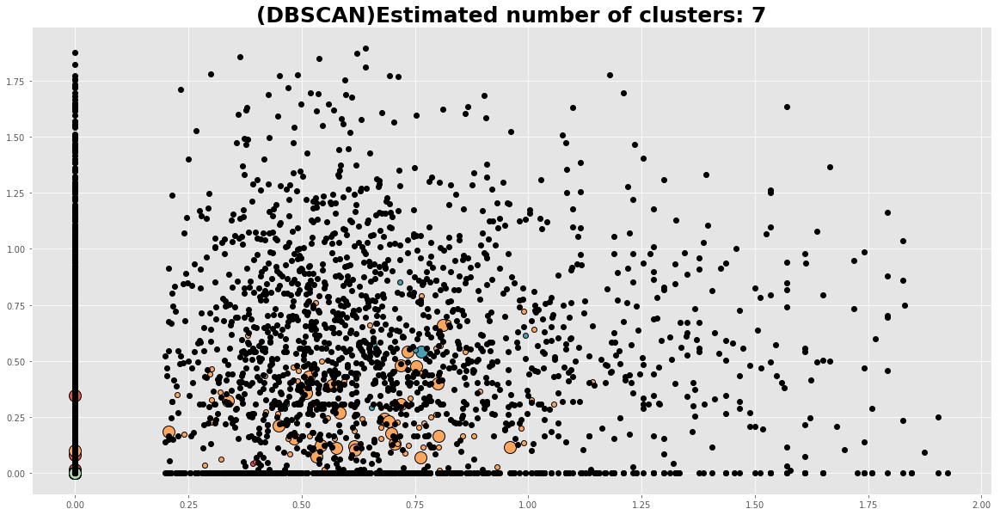

In [322]:
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.5, min_samples=10).fit(Matrix)
#clusterer = DBSCAN(eps=0.5, min_samples=5, metric='euclidean', leaf_size=30)
#cluster_labels = clusterer.fit_predict(Matrix_x_fre156)

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(Matrix, labels))

plt.rcParams['font.size'] = 10
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = Matrix[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = Matrix[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('(DBSCAN)Estimated number of clusters: %d' % n_clusters_,fontweight='bold', fontsize=25 )

### 3.5 Interpretation and Evaluation

Here we implement the following methods to interpret and evaluate the results: kmeans centroid analysis, comparing clustering results by pairplot matrices and Sankey diagram for studying the overlap between the results of different clustering techniques.

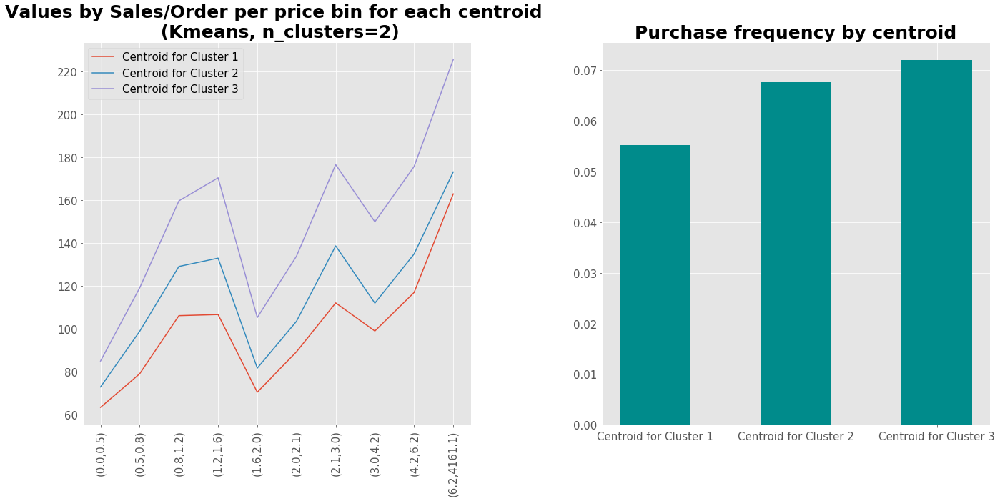

In [364]:
# Kmeans centroid breakdown:
n_clusters = 3

clusterer = KMeans(n_clusters=n_clusters, random_state=seed, n_init = 50, init='k-means++')
cluster_labels = clusterer.fit_predict(Matrix)

cluster_centres = clusterer.cluster_centers_
inverse_transformed_centers = (np.exp(cluster_centres) + 1) * (\
         df_by_customer_seg_out.quantile(0.75).values - df_by_customer_seg_out.quantile(0.25).values) +\
         df_by_customer_seg_out.quantile(0.25).values
#print(inverse_transformed_centers)

#cluster_centres
#df_by_customer_seg_out.quantile(0.75).values

# print('Values for centres 1 :{}'.format(inverse_transformed_centers[0]))
# print('Values for centres 2 :{}'.format(inverse_transformed_centers[1]))

plt.rcParams['font.size'] = 15
f, (ax1,ax2) = plt.subplots(1,2, figsize=(20,10))
ind_pc = np.array([x for x, _ in enumerate(list(df_transformed.columns.values))])
#print(inverse_transformed_centers[0][1:])
ax1.plot(labels2, inverse_transformed_centers[0][1:])
ax1.plot(labels2, inverse_transformed_centers[1][1:])
ax1.plot(labels2, inverse_transformed_centers[2][1:])
ax1.legend(['Centroid for Cluster 1', 'Centroid for Cluster 2', 'Centroid for Cluster 3'], loc='upper left')
#ax1.set_xticklabels(['pb1','pb2','pb3','pb4', 'pb5', 'pb6', 'pb7', 'pb8', 'pb9', 'pb10'])
for x in ax1.get_xticklabels():
    x.set_rotation(90)
ax1.set_title('Values by Sales/Order per price bin for each centroid \n (Kmeans, n_clusters=2)',fontweight='bold', fontsize=25)


ax2.bar(np.arange(1,n_clusters+1), inverse_transformed_centers[:,0], width,tick_label =['Centroid for Cluster 1',\
                                  'Centroid for Cluster 2', 'Centroid for Cluster 3'], label='Sales/Order', color='darkcyan', alpha=1)
ax2.set_title('Purchase frequency by centroid', fontweight='bold', fontsize=25)
ax2.tick_params(axis='x', which='major', pad=5)

#plt.xticks(rotation=90)
f.tight_layout()


In [372]:
df_by_customer_seg_out.head(1)

,normal_frequency,pb1,pb2,pb3,pb4,pb5,pb6,pb7,pb8,pb9,pb10
2,0.0,21.0,67.8,130.0,259.56,78.52,67.08,136.44,85.7,228.05,383.4


In [381]:
# Comparing distribution per clusters for each method:
# Create columns for each cluster method:
n_clusters = 3

kmeans3_ = KMeans(n_clusters=n_clusters, random_state=seed, n_init = 50, init='k-means++').fit(Matrix)
hier3_ = AgglomerativeClustering(n_clusters=n_clusters, affinity='cosine', linkage='average').fit(Matrix)  
spec3_ = SpectralClustering(n_clusters=n_clusters, eigen_solver='amg', random_state=seed,\
        n_init=10, gamma=1, affinity='nearest_neighbors',\
        n_neighbors = 50, assign_labels='discretize').fit(Matrix)

clusterings_names = {'0':'kmeans3_', '1': 'hier3_', '2':'spec3_'} 
clusterings = {'0':kmeans3_, '1': hier3_, '2':spec3_} 

trials = ['kmeans3_', 'hier3_', 'spec3_']

df_by_customer_segout_with_cluster = df_transformed.copy()

i = 0

while i<len(clusterings):
    df_by_customer_segout_with_cluster.loc[:,clusterings_names[str(i)]] =  clusterings[str(i)].labels_
    df_by_customer_segout_with_cluster.loc[:,clusterings_names[str(i)]] =  clusterings_names[str(i)] + \
                df_by_customer_segout_with_cluster.loc[:,clusterings_names[str(i)]].apply(str)
    i += 1

In [379]:
df_by_customer_segout_with_cluster.head(1)

,normal_frequency,pb1,pb2,pb3,pb4,pb5,pb6,pb7,pb8,pb9,pb10,kmeans3_,hier3_,spec3_
2,0.0,21.0,67.8,130.0,259.56,78.52,67.08,136.44,85.7,228.05,383.4,kmeans3_2,hier3_0,spec3_2


/Users/mac/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



Text(0.5, 0.98, '(Kmeans)Pairwise correlation and Distribbution: Frequency and Sales/Order across Price Bins')

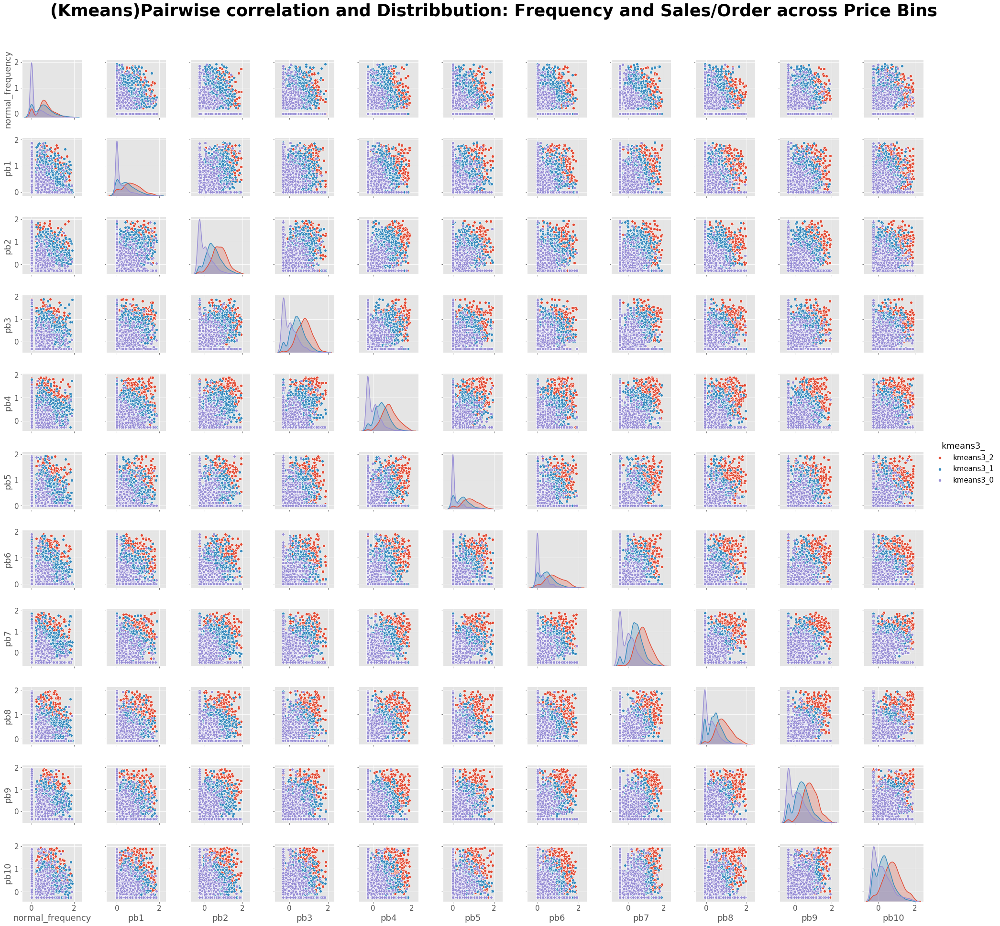

In [382]:
# Pairplot for Kmeans:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.pairplot(df_by_customer_segout_with_cluster,hue='kmeans3_')
plt.subplots_adjust(top=.92)
ax.fig.suptitle('(Kmeans)Pairwise correlation and Distribbution: Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=35)


Text(0.5, 0.98, '(Hierarchical)Pairwise correlation and Distribbution: Frequency and Sales/Order across Price Bins')

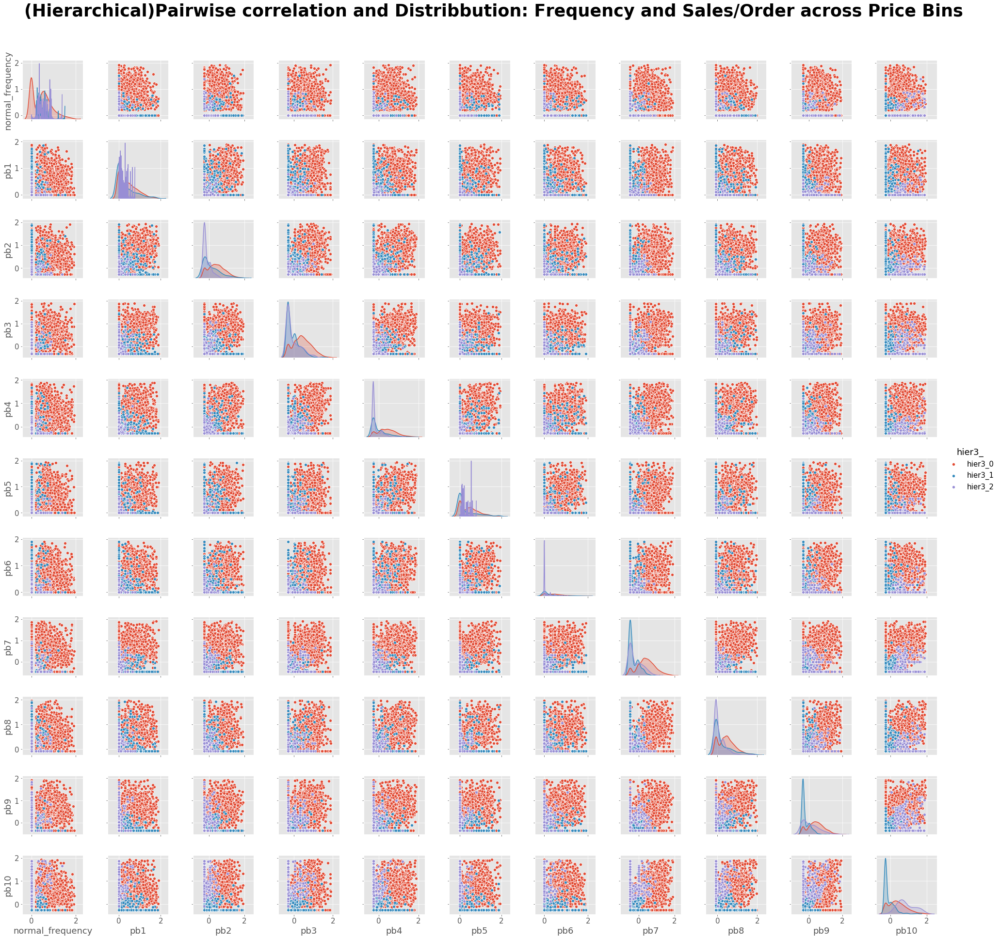

In [383]:
# Pairplot for Hierarchical:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.pairplot(df_by_customer_segout_with_cluster,hue='hier3_')
plt.subplots_adjust(top=.92)
ax.fig.suptitle('(Hierarchical)Pairwise correlation and Distribbution: Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=35)


Text(0.5, 0.98, '(Spectral)Pairwise correlation and Distribbution: Frequency and Sales/Order across Price Bins')

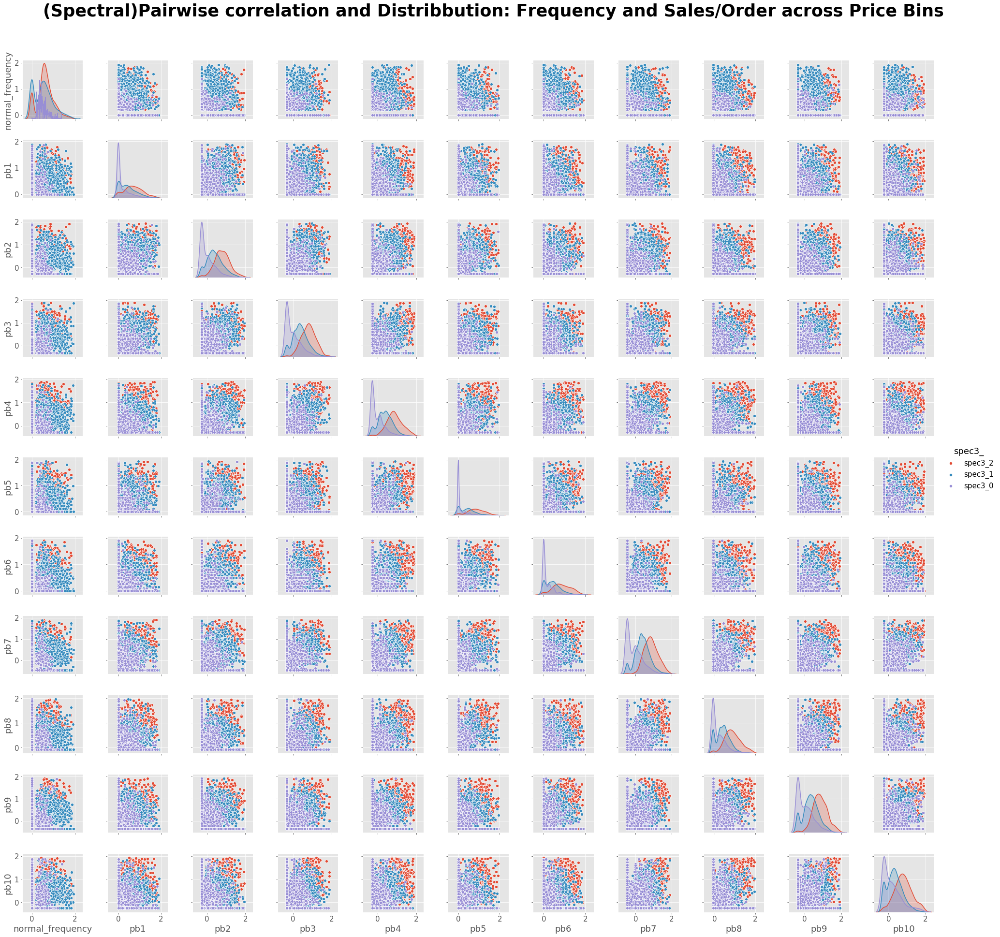

In [384]:
# Pairplot for Spectral:
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = 20,10
ax = sns.pairplot(df_by_customer_segout_with_cluster,hue='spec3_')
plt.subplots_adjust(top=.92)
ax.fig.suptitle('(Spectral)Pairwise correlation and Distribbution: Frequency and Sales/Order across Price Bins',fontweight='bold', fontsize=35)


In [403]:
# Draw A Sankey Diagram to evaluate the stability of clustering results across different clustering methods:

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Change number of clustering instances and number number of clusters as desired here
n_clusters = 3

km3_ = KMeans(n_clusters=n_clusters, random_state=seed, n_init = 50, init='k-means++').fit(Matrix)
hi3_ = AgglomerativeClustering(n_clusters=n_clusters, affinity='cosine', linkage='average').fit(Matrix)  
sp3_ = SpectralClustering(n_clusters=n_clusters, eigen_solver='amg', random_state=seed,\
        n_init=10, gamma=1, affinity='nearest_neighbors',\
        n_neighbors = 50, assign_labels='discretize').fit(Matrix)

clusterings_names = {'0':'km3_', '1': 'hi3_', '2':'sp3_'} 
clusterings = {'0':km3_, '1': hi3_, '2':sp3_} 

trials = ['km3_', 'hi3_', 'sp3_']

df_by_customer_segout_with_clusterx = df_transformed.copy()

i = 0

while i<len(clusterings):
    df_by_customer_segout_with_clusterx.loc[:,clusterings_names[str(i)]] =  clusterings[str(i)].labels_
    df_by_customer_segout_with_clusterx.loc[:,clusterings_names[str(i)]] =  clusterings_names[str(i)] + \
                df_by_customer_segout_with_clusterx.loc[:,clusterings_names[str(i)]].apply(str)
    i += 1
df_sankey = df_by_customer_segout_with_clusterx.copy()

df_sankey.loc[:,'observedclass'] = df_sankey.index
df_sankey_reset = df_by_customer_segout_with_clusterx.reset_index(drop = True)

groups = np.unique(df_sankey_reset.loc[:,'km3_':])
runs = df_sankey_reset.loc[:,'km3_':].columns.tolist()
colour = ["blue"]*3 + ["yellow"]*3 + ["red"]*3

indices = {}
overlap = {}


# Building a dictionary of the indices for each cluster, so that overlap can be assessed

for run in runs:
    clusters = np.unique(df_sankey.loc[:,run])
    for cluster in clusters:
        indices[cluster] = df_sankey.loc[df_sankey.loc[:,run] == cluster,run].index

# building a dictionary with the overlaps
        
for key1, item1 in indices.items():
    for key2, item2 in indices.items():
        if ((key1 != key2) & (trials.index(key1[:-1]) +1 == trials.index(key2[:-1]))): 
            overlap[key1 + key2] = np.in1d(indices[key1],indices[key2])

# Initialising the lists and then populating them with the values, using another loop
            
source = []            
target = []
value = []
name=[]


for key, item in overlap.items():
    if (item.sum() != 0):
        source.extend(np.where(groups == key[0:5])[:4])
        target.extend(np.where(groups == key[5:])[:4])
        value.append(item.sum())
        name.append(key[0:5])
    
import plotly as py
#py.tools.set_credentials_file(username='user_name', api_key='password')


data = dict(
    type='sankey',
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(
        color = "black",
        width = 0.5
      ),
      label = groups,
      color = colour
    ),
    link = dict(
      source = source,
      target = target,
      value = value
  ))

layout =  dict(
    title = "Customers Segments Sankey Diagram",
    font = dict(
      size = 10
    )
)

fig = dict(data=[data], layout=layout)
py.plotly.iplot(fig, validate=False)


In [404]:
py.plotly.iplot(fig, validate=False)

/Users/mac/anaconda3/lib/python3.6/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead

